# Projeto -  Análise Textual do Noticiário Econômico Para Previsão de Ativos Financeiros ações Tesla

![Logo](https://img.freepik.com/free-vector/gradient-stock-market-concept_23-2149166929.jpg?w=1380&t=st=1690864999~exp=1690865599~hmac=9560af55f1bc856f1f8f0c34bc9923f5edd97ee1beffa21ddb37361180c50229)


Neste projeto de Text Analytics voltado para ações da empresa Tesla, o objetivo principal é realizar previsões das ações, utilizando técnicas avançadas de análise de série temporal e processamento de linguagem natural. Ao combinar essas abordagens, seremos capazes de obter informações valiosas para a tomada de decisões estratégicas.

A análise de série temporal é uma metodologia crucial para identificar padrões e tendências ao longo do tempo. Ao aplicar essa técnica nas informações históricas das ações da Tesla, poderemos prever os possíveis movimentos futuros do mercado, contribuindo para um melhor entendimento do comportamento dos investidores e das flutuações de preços.

Além disso, empregaremos o processamento de linguagem natural (PLN) para classificar os sentimentos dos textos relacionados à Tesla presentes em diversas fontes, como notícias, relatórios financeiros, redes sociais e comentários de analistas. Essa classificação de sentimentos nos permitirá compreender a percepção geral do público em relação à empresa e seu impacto nas oscilações do mercado de ações.

Outra importante etapa do projeto consistirá na extração de tópicos utilizando técnicas como o Latent Dirichlet Allocation (LDA), Transforms e BART Topics.

Essa abordagem nos possibilitará identificar os principais assuntos abordados nos textos analisados, tais como inovações tecnológicas, resultados financeiros, desenvolvimento de novos produtos, impactos ambientais, entre outros. Com esse conhecimento, poderemos direcionar melhor nossos esforços na interpretação dos dados e gerar insights mais relevantes para a empresa.

A partir dessas análises integradas, esperamos extrair informações valiosas e insights significativos que contribuirão para uma visão mais precisa e abrangente do mercado de ações da intel. A combinação de técnicas de análise de série temporal, processamento de linguagem natural e extração de tópicos permitirá que a empresa tome decisões mais informadas e estratégicas, maximizando seu desempenho e competitividade no setor automotivo e de energia limpa.

Com a expertise em análise de texto e o uso das mais recentes técnicas de inteligência artificial, este projeto promete gerar resultados sólidos.


# **Modelos machine learning será criado**


**Modelos machine learning**

- Análise de série temporal - ARIMA AutoARIMA, SARIMA

- Regressão linear

- Random Forest Regressor

- LGBM Regressor

- XGB Regressor

**Modelos processamento linguagem natural**

- Word2Vec

- Doc2Vec

- BART

**Modelos extração tópicos**

- Extração tópicos LDA

- BART Topics


In [ ]:
!pip install pmdarima
!pip install watermark
!pip install transformers
!pip install torch
!pip install lightgbm

In [1]:
# Imports
# Carregando bibliotecas de sistema
import os
import re
import numpy as np
import pandas as pd

# Carregando bibliotecas de pré-processamento
from sklearn.preprocessing import MinMaxScaler

# carregando biblioteca de treino teste
from sklearn.model_selection import train_test_split

# Carregando bibliotecas de machine learning
import xgboost
import lightgbm
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from math import sqrt

# Carregando biblioteca de modelos estatisticos
from pmdarima import auto_arima
from pandas_datareader.data import DataReader
from datetime import datetime
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller, acf, pacf
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima.model import ARIMA

# Carregando bibliotecas de processamento linguagem natural
import nltk
from textblob import TextBlob
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# Carregando bibliotecas de visualização de dados
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
sns.set_theme(style="ticks")
sns.set_palette("colorblind", color_codes=True)

# Versões dos pacotes usados neste jupyter notebook
%reload_ext watermark
%watermark -a "Rafael Gallo - Bibliotecas carregadas" --iversions

# Biblioteca warnings
import warnings
warnings.filterwarnings('ignore')

Author: Rafael Gallo - Bibliotecas carregadas

numpy     : 1.24.3
re        : 2.2.1
nltk      : 3.7
lightgbm  : 3.3.5
pandas    : 2.0.3
seaborn   : 0.12.2
plotly    : 5.9.0
xgboost   : 1.7.5
matplotlib: 3.7.1



## Carregando base dados

In [3]:
# Dataset das ações texto
data_nan = pd.read_csv("data_Tesla_Latest_News/TSLA_news.csv")
data_nan

,date,site,text,link,growth
0,2022-07-28 08:23:00,Barrons.com,Fords Earnings Needed To Clear a High Bar. The...,https://www.barrons.com/articles/ford-earnings...,NaN
1,2022-07-28 07:45:00,Investor's Business Daily,"Tesla Stock Vs. BYD Stock: Tesla Bounces, Chin...",https://www.investors.com/news/tesla-stock-vs-...,NaN
2,2022-07-28 07:14:00,Motley Fool,Why Did Elon Musk Sell Tesla's Bitcoin?,https://www.fool.com/investing/2022/07/28/why-...,NaN
3,2022-07-28 06:00:00,Yahoo Finance Video,'We have woefully surrendered our energy indep...,https://finance.yahoo.com/video/woefully-surre...,NaN
4,2022-07-28 06:00:00,Yahoo Finance Video,Influencers with Andy Serwer: Bob Nardelli,https://finance.yahoo.com/video/influencers-an...,NaN
...,...,...,...,...,...
414,2022-07-16 06:30:00,Motley Fool,Tesla Sees Production Decline-Did Management O...,https://www.fool.com/investing/2022/07/16/tesl...,NaN
415,2022-07-16 01:00:00,Bloomberg,Porsches Luxury IPO Pitch Meets Investor Conce...,https://finance.yahoo.com/news/porsche-luxury-...,NaN
416,2022-07-15 22:16:00,LA Times,Elon Musk demands months for trial prep in Twi...,https://finance.yahoo.com/news/elon-musk-deman...,NaN
417,2022-07-15 17:44:00,Barrons.com,"Tesla, Ford, and GMs Plan to Unlock EV Battery...",https://www.barrons.com/articles/tesla-ford-gm...,NaN


In [4]:
# Dataset das ações dos preços
data_acoes = pd.read_csv("TSLA.csv")
data_acoes

,Date,Open,High,Low,Close,Adj Close,Volume
0,2010-07-01,1.666667,1.728000,1.351333,1.464000,1.464000,123282000
1,2010-07-02,1.533333,1.540000,1.247333,1.280000,1.280000,77097000
2,2010-07-06,1.333333,1.333333,1.055333,1.074000,1.074000,103003500
3,2010-07-07,1.093333,1.108667,0.998667,1.053333,1.053333,103825500
4,2010-07-08,1.076000,1.168000,1.038000,1.164000,1.164000,115671000
...,...,...,...,...,...,...,...
3290,2023-07-28,259.859985,267.250000,258.230011,266.440002,266.440002,111446000
3291,2023-07-31,267.480011,269.079987,263.779999,267.429993,267.429993,84582200
3292,2023-08-01,266.260010,266.470001,260.250000,261.070007,261.070007,83166000
3293,2023-08-02,255.570007,259.519989,250.490005,254.110001,254.110001,101752900


In [5]:
# Visualizando os 5 últimos dados
data_acoes.tail()

,Date,Open,High,Low,Close,Adj Close,Volume
3290,2023-07-28,259.859985,267.250000,258.230011,266.440002,266.440002,111446000
3291,2023-07-31,267.480011,269.079987,263.779999,267.429993,267.429993,84582200
3292,2023-08-01,266.260010,266.470001,260.250000,261.070007,261.070007,83166000
3293,2023-08-02,255.570007,259.519989,250.490005,254.110001,254.110001,101752900
3294,2023-08-03,252.039993,260.489990,252.000000,259.320007,259.320007,97569100


In [6]:
# Linhas colunas
data_acoes.shape

(3295, 7)

In [7]:
# Info dados
data_acoes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3295 entries, 0 to 3294
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       3295 non-null   object 
 1   Open       3295 non-null   float64
 2   High       3295 non-null   float64
 3   Low        3295 non-null   float64
 4   Close      3295 non-null   float64
 5   Adj Close  3295 non-null   float64
 6   Volume     3295 non-null   int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 180.3+ KB


In [8]:
# Tipo dados
data_acoes.dtypes

Date          object
Open         float64
High         float64
Low          float64
Close        float64
Adj Close    float64
Volume         int64
dtype: object

In [9]:
# Ajustamos a coluna de data
data_acoes["Date"] = pd.to_datetime(data_acoes["Date"])

In [10]:
# Visualiza uma amostra dos dados
data_acoes.head(25)

,Date,Open,High,Low,Close,Adj Close,Volume
0,2010-07-01,1.666667,1.728000,1.351333,1.464000,1.464000,123282000
1,2010-07-02,1.533333,1.540000,1.247333,1.280000,1.280000,77097000
2,2010-07-06,1.333333,1.333333,1.055333,1.074000,1.074000,103003500
3,2010-07-07,1.093333,1.108667,0.998667,1.053333,1.053333,103825500
4,2010-07-08,1.076000,1.168000,1.038000,1.164000,1.164000,115671000
5,2010-07-09,1.172000,1.193333,1.103333,1.160000,1.160000,60759000
6,2010-07-12,1.196667,1.204667,1.133333,1.136667,1.136667,33037500
7,2010-07-13,1.159333,1.242667,1.126667,1.209333,1.209333,40201500
8,2010-07-14,1.196000,1.343333,1.184000,1.322667,1.322667,62928000
9,2010-07-15,1.329333,1.433333,1.266667,1.326000,1.326000,56097000


In [11]:
# Drop dos valores NA
data_acoes.dropna(inplace = True)

In [12]:
# Checando por valores ausentes
data_acoes.isnull().sum()

Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64

In [13]:
# Shape
data_acoes.shape

(3295, 7)

In [14]:
data_acoes["Date"].max()

Timestamp('2023-08-03 00:00:00')

In [15]:
data_acoes["Date"].min()

Timestamp('2010-07-01 00:00:00')

# Análise de dados

Text(0, 0.5, 'BSESN')

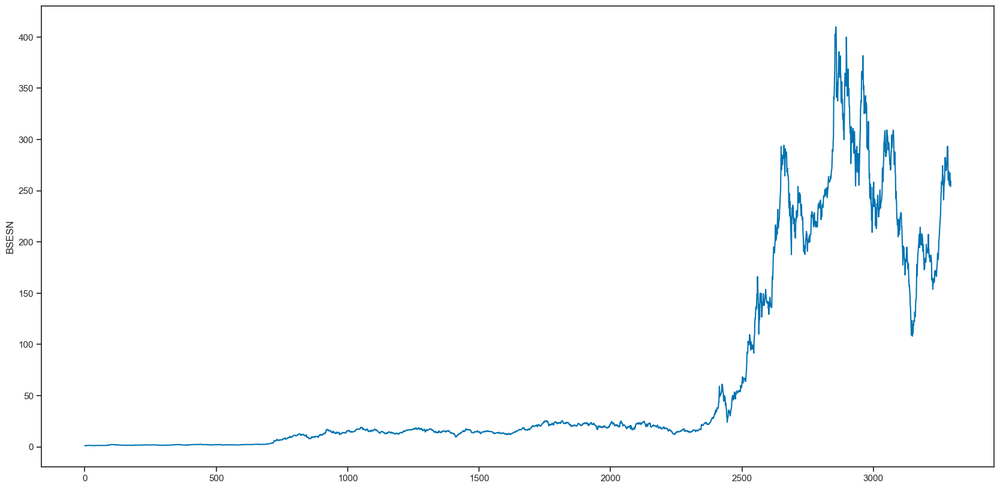

In [16]:
# Plot
plt.figure(figsize = (20.5,10))
data_acoes['Close'].plot()
plt.ylabel('BSESN')

In [17]:
acao_open = data_acoes["Open"].value_counts()
acao_open

Open
2.000000      6
1.866667      6
14.666667     5
1.900000      5
15.333333     4
             ..
17.049999     1
17.618000     1
17.512667     1
17.840000     1
252.039993    1
Name: count, Length: 2997, dtype: int64

In [18]:
acao_open = data_acoes["High"].value_counts()
acao_open

High
1.866667      7
2.300000      7
2.000000      7
1.800000      6
2.320000      5
             ..
18.830000     1
18.779333     1
18.346666     1
17.386667     1
260.489990    1
Name: count, Length: 2992, dtype: int64

In [19]:
# Calcular o retorno diário
data_acoes['Daily_Return'] = data_acoes['Close'].pct_change()

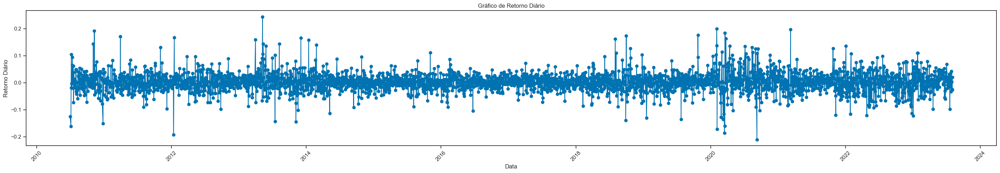

In [20]:
# Gráfico Retorno Diário
plt.figure(figsize=(35.5, 5))
plt.plot(data_acoes['Date'], data_acoes['Daily_Return'], marker='o', linestyle='-', color='b')
plt.xlabel('Data')
plt.ylabel('Retorno Diário')
plt.title('Gráfico de Retorno Diário')
plt.xticks(rotation=45)
plt.grid(False)
plt.show()

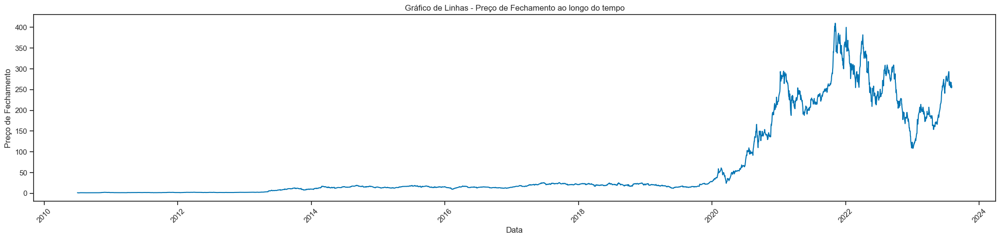

In [21]:
# 1. Gráfico de Linhas para preços de fechamento
plt.figure(figsize=(25.5, 5))
plt.plot(data_acoes['Date'], data_acoes['Close'])
plt.xlabel('Data')
plt.ylabel('Preço de Fechamento')
plt.title('Gráfico de Linhas - Preço de Fechamento ao longo do tempo')
plt.xticks(rotation=45)

plt.show()

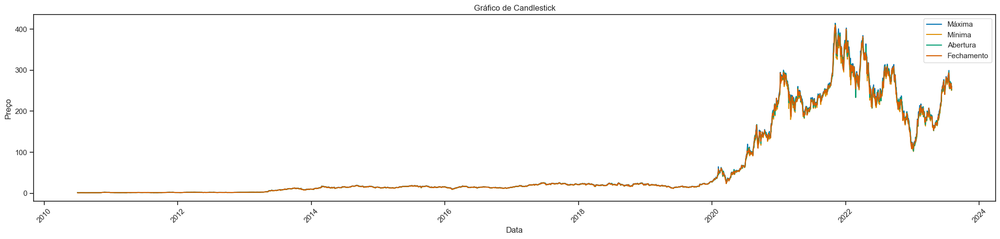

In [22]:
# 2. Gráfico de Candlestick
plt.figure(figsize=(25.5, 5))

plt.plot(data_acoes['Date'], data_acoes['High'], label='Máxima')
plt.plot(data_acoes['Date'], data_acoes['Low'], label='Mínima')
plt.plot(data_acoes['Date'], data_acoes['Open'], label='Abertura')
plt.plot(data_acoes['Date'], data_acoes['Close'], label='Fechamento')
plt.xlabel('Data')
plt.ylabel('Preço')
plt.title('Gráfico de Candlestick')
plt.legend()
plt.xticks(rotation=45)

plt.show()

Text(0, 0.5, 'Total')

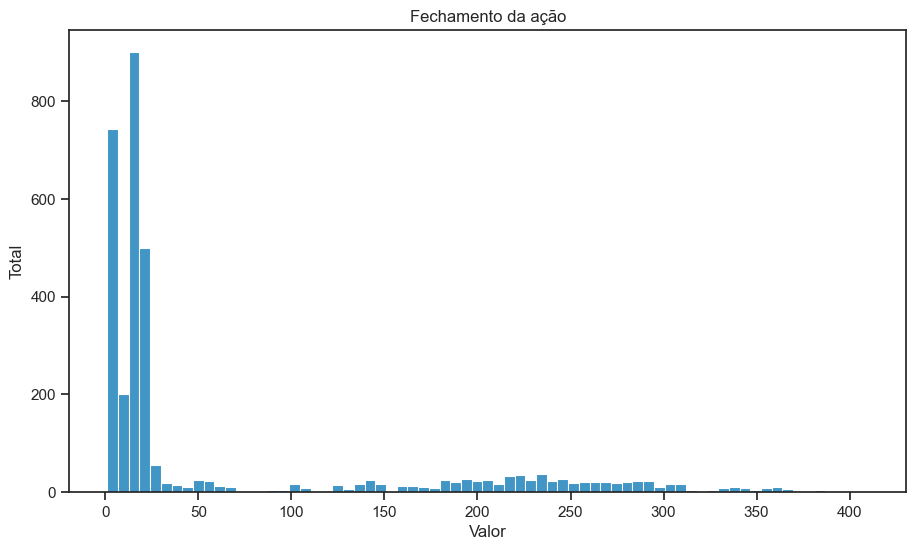

In [23]:
# Gráfico de fechamento
plt.figure(figsize=(10.8, 6))
sns.histplot(data_acoes["Close"])
plt.title("Fechamento da ação")
plt.xlabel("Valor")
plt.ylabel("Total")

In [24]:
# 3. Retorno Diário
data_acoes['Daily_Return'] = data_acoes['Close'].pct_change()
print(data_acoes['Daily_Return'].head())

0         NaN
1   -0.125683
2   -0.160937
3   -0.019243
4    0.105064
Name: Daily_Return, dtype: float64


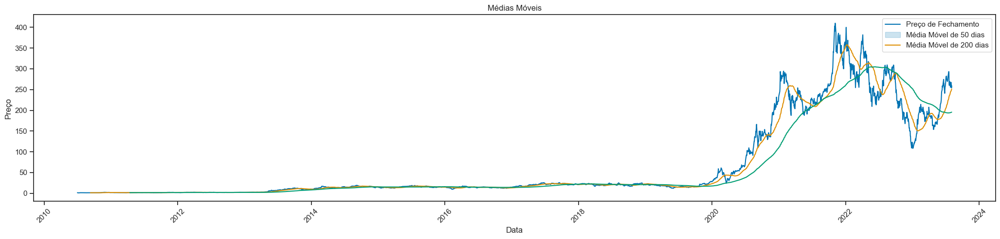

In [25]:
# 4. Médias Móveis
data_acoes['SMA_50'] = data_acoes['Close'].rolling(window=50).mean()
data_acoes['SMA_200'] = data_acoes['Close'].rolling(window=200).mean()

# Plot médias móveis
plt.figure(figsize=(25.5, 5))
sns.lineplot(x="Date", y="Close", data = data_acoes)
sns.lineplot(x="Date", y="SMA_50", data = data_acoes)
sns.lineplot(x="Date", y="SMA_200", data = data_acoes)
plt.legend(["Preço de Fechamento", "Média Móvel de 50 dias", "Média Móvel de 200 dias"])
plt.xlabel('Data')
plt.ylabel('Preço')
plt.title('Médias Móveis')
plt.xticks(rotation=45)

plt.show()

In [26]:
# 5. Análise Descritiva
print(data_acoes[['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume']].describe())


              Open         High          Low        Close    Adj Close  \
count  3295.000000  3295.000000  3295.000000  3295.000000  3295.000000   
mean     65.179600    66.639451    63.600017    65.158829    65.158829   
std      98.411143   100.651838    95.926842    98.324515    98.324515   
min       1.076000     1.108667     0.998667     1.053333     1.053333   
25%       9.955000    10.155667     9.731666     9.865666     9.865666   
50%      16.648001    16.896000    16.406000    16.664667    16.664667   
75%      52.809334    54.377001    51.211668    53.264000    53.264000   
max     411.470001   414.496674   405.666656   409.970001   409.970001   

             Volume  
count  3.295000e+03  
mean   9.603217e+07  
std    8.104412e+07  
min    1.777500e+06  
25%    4.452585e+07  
50%    7.911450e+07  
75%    1.226302e+08  
max    9.140820e+08  


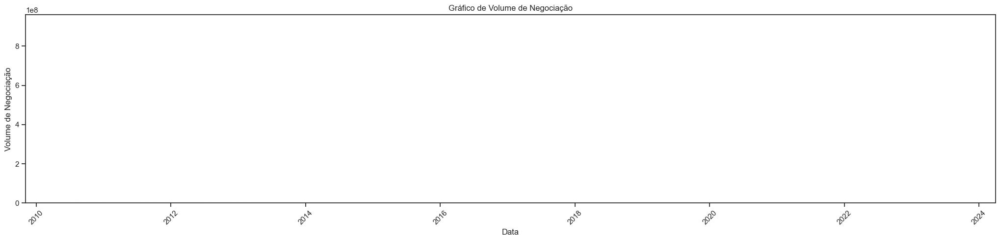

In [27]:
# 6. Gráfico de Volume
plt.figure(figsize=(25.5, 5))
plt.bar(data_acoes['Date'], data_acoes['Volume'])
plt.xlabel('Data')
plt.ylabel('Volume de Negociação')
plt.title('Gráfico de Volume de Negociação')
plt.xticks(rotation=45)

plt.show()

## Plot da Média Móvel

In [28]:
# Variável que usaremos no gráfico
close = data_acoes['Close']

In [29]:
# Calcula as estatísticas móveis
ma = close.rolling(window = 50).mean()
std = close.rolling(window = 50).std()

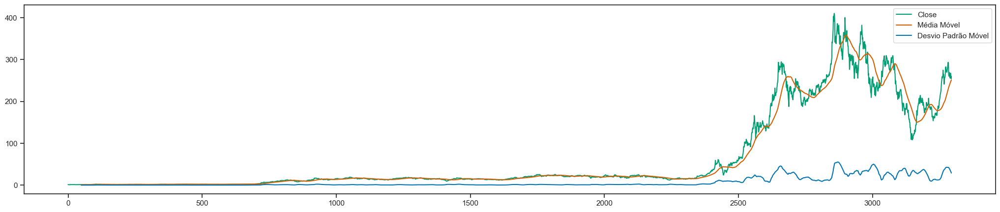

In [30]:
# Plot
plt.figure(figsize=(25.5, 5))
data_acoes['Close'].plot(color = 'g', label = 'Close')
ma.plot(color = 'r', label = 'Média Móvel')
std.plot(label = 'Desvio Padrão Móvel')
plt.legend()

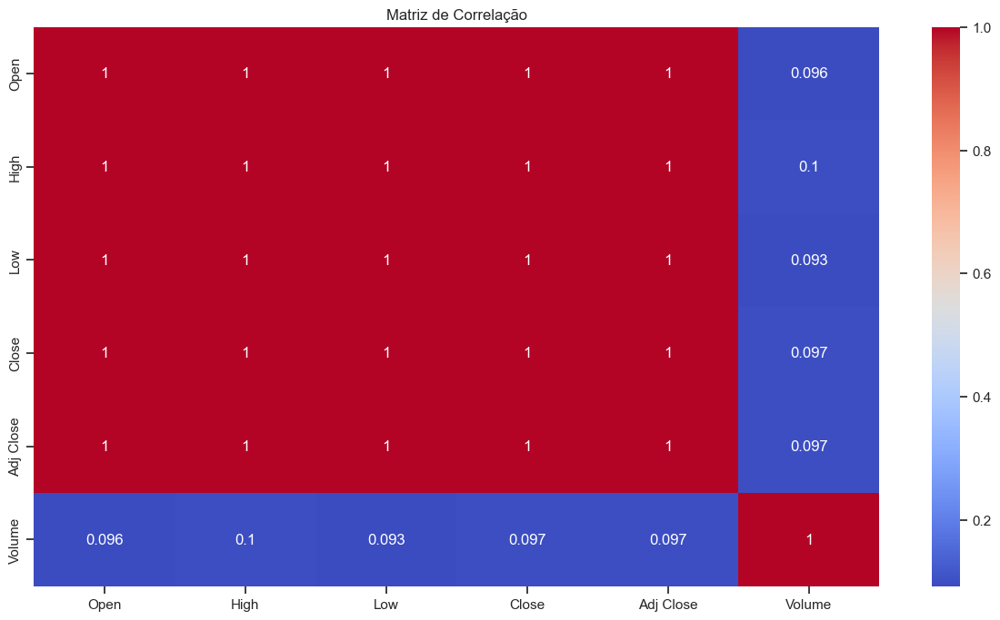

In [31]:
# 7. Análise de Correlação
correlation_matrix = data_acoes[['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume']].corr()
plt.figure(figsize=(15, 8))

sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Matriz de Correlação')
plt.show()

**Gráfico de Candlestick interativo**

In [32]:
plt.figure(figsize=(25.5, 5))

fig = go.Figure(data=[go.Candlestick(x=data_acoes['Date'],
                open=data_acoes['Open'],
                high=data_acoes['High'],
                low=data_acoes['Low'],
                close=data_acoes['Close'])])

fig.update_layout(title='Gráfico de Candlestick',
                  xaxis_title='Data',
                  yaxis_title='Preço',
                  xaxis_rangeslider_visible=False)

fig.show()

<Figure size 2550x500 with 0 Axes>

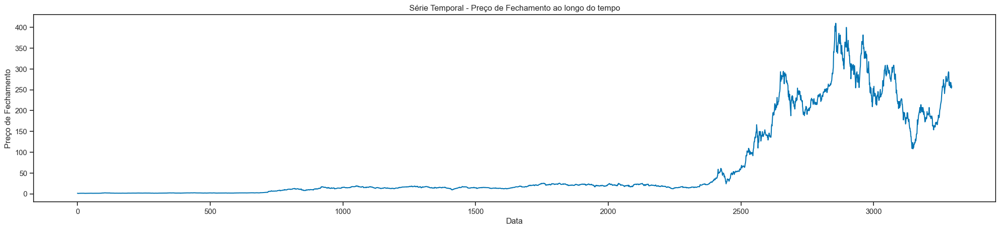

In [33]:
# Gráfico série temporal

plt.figure(figsize=(25.5, 5))
plt.plot(data_acoes['Close'])
plt.xlabel('Data')
plt.ylabel('Preço de Fechamento')
plt.title('Série Temporal - Preço de Fechamento ao longo do tempo')
plt.grid(False)
plt.show()

## Plot dos Retornos

Text(0.5, 1.0, 'Retornos')

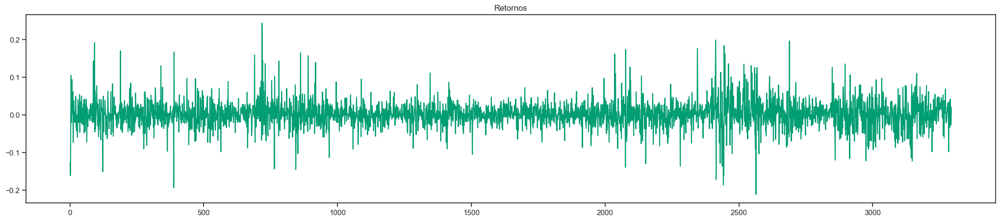

In [34]:
# Calcula os retornos (ganhos)
retornos = close / close.shift(1) - 1

# Plot
plt.figure(figsize=(25.5, 5))
retornos.plot(label = 'Retorno', color = 'g')
plt.title("Retornos")

**Treino e teste**

In [35]:
x = data_acoes["Close"]
x.shape

(3295,)

In [36]:
# Split em dados de treino e teste
dados_treino = data_acoes[:3000]
dados_teste = data_acoes[3000:]

In [37]:
dados_treino.shape

(3000, 10)

In [38]:
dados_teste.shape

(295, 10)

## Testando a Estacionaridade

Uma série estacionária é o que em matemática costuma se chamar série convergente, ou seja, aquela que flutua em torno de uma mesma média ao longo do tempo.

Para criar um modelo de previsão de série temporal, precisamos validar a suposição de que a série é estacionária. Vamos criar uma função e testar em nossos dados.

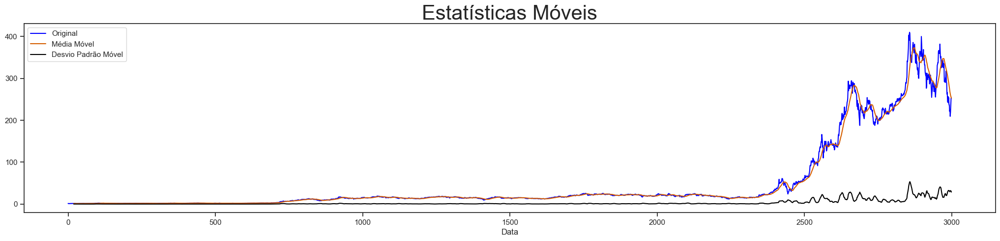

Resultados do Teste Dickey Fuller:
ADF Test Statistic : 0.13130632751019886
Valor-p : 0.9681346574562125
Número de Lags : 28
Número de Observações : 2971
Evidência fraca contra hipótese nula. Série temporal não é estacionária.


In [39]:
# Função para estar a eatacionaridade
def testa_estacionaridade(timeseries):

    # Calcula as estatísticas móveis
    rolmean = timeseries.rolling(20).mean()
    rolstd = timeseries.rolling(20).std()

    # Plot das estatísticas móveis
    plt.figure(figsize=(25.5, 5))
    plt.plot(timeseries, color = 'blue', label = 'Original')
    plt.plot(rolmean, color = 'r', label = 'Média Móvel')
    plt.plot(rolstd, color = 'black', label = 'Desvio Padrão Móvel')
    plt.xlabel('Data')
    plt.legend()
    plt.title('Estatísticas Móveis',  fontsize = 30)
    plt.show(block = False)

    print('Resultados do Teste Dickey Fuller:')
    result = adfuller(timeseries, autolag = 'AIC')
    labels = ['ADF Test Statistic', 'Valor-p', 'Número de Lags', 'Número de Observações']

    for value,label in zip(result, labels):
        print(label+' : '+str(value) )
    if result[1] <= 0.05:
        print("Evidências fortes para rejeitar a hipótese nula (H0). Os dados são estacionários.")
    else:
        print("Evidência fraca contra hipótese nula. Série temporal não é estacionária.")

# Aplica a função
testa_estacionaridade(dados_treino['Close'])

0            NaN
1            NaN
2            NaN
3            NaN
4            NaN
          ...   
2995    5.603288
2996    5.585534
2997    5.570921
2998    5.559548
2999    5.553514
Name: Close, Length: 3000, dtype: float64


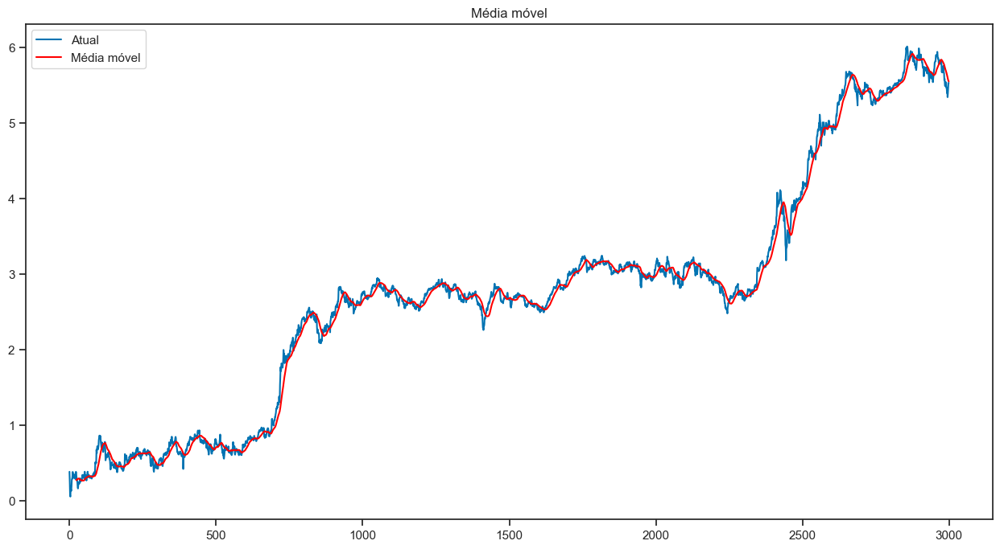

In [40]:
# Aplica transformação de log
dados_treino_log = np.log(dados_treino['Close'])
dados_teste_log = np.log(dados_teste['Close'])

# Média móvel
media_movel = dados_treino_log.rolling(24).mean()
print(media_movel)

# Plot
plt.figure(figsize=(15.5, 8))
plt.plot(dados_treino_log)
plt.plot(media_movel, color = 'red')
plt.title("Média móvel")
plt.legend(["Atual", "Média móvel"])

<Figure size 1800x500 with 0 Axes>

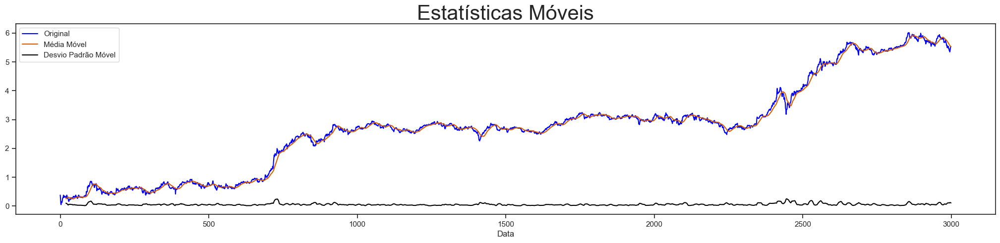

Resultados do Teste Dickey Fuller:
ADF Test Statistic : -0.2554608444855354
Valor-p : 0.9315798168100855
Número de Lags : 0
Número de Observações : 2999
Evidência fraca contra hipótese nula. Série temporal não é estacionária.


In [41]:
# Drop de valores NA
dados_treino_log.dropna(inplace = True)
dados_teste_log.dropna(inplace = True)

# Aplica a função
# Plot
plt.figure(figsize=(18, 5))
testa_estacionaridade(dados_treino_log)

<Figure size 1550x800 with 0 Axes>

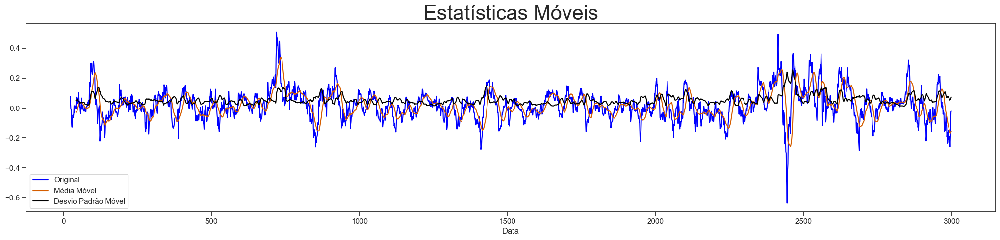

Resultados do Teste Dickey Fuller:
ADF Test Statistic : -10.658673455994728
Valor-p : 4.465404657045767e-19
Número de Lags : 13
Número de Observações : 2963
Evidências fortes para rejeitar a hipótese nula (H0). Os dados são estacionários.


In [42]:
# Calcula a diferença entre log e media_movel
dados_treino_log_diff = dados_treino_log - media_movel
dados_treino_log_diff.dropna(inplace = True)

# Aplcia a função
# Plot
plt.figure(figsize=(15.5, 8))
testa_estacionaridade(dados_treino_log_diff)

## Modelo - AutoARIMA

**Definição modelo AutoARIMA**

- O AutoARIMA é uma abordagem automática para identificar os parâmetros adequados (p, d, q) de um modelo ARIMA. Os parâmetros (p, d, q) correspondem ao grau de autoregressão, à diferença e à média móvel, respectivamente. Determinar os valores ótimos desses parâmetros pode ser um processo complicado e, em alguns casos, pode exigir tentativa e erro. O AutoARIMA automatiza esse processo, ajustando vários modelos ARIMA com diferentes combinações de parâmetros e selecionando o modelo que melhor se ajusta aos dados. Ele geralmente utiliza técnicas como busca exaustiva, avaliação de critérios de seleção (como o critério de informação de Akaike - AIC ou critério de informação bayesiana - BIC) e validação cruzada para encontrar o melhor modelo ARIMA para os dados disponíveis.

**Modelo ARIMA**

ARIMA significa "AutoRegressive Integrated Moving Average" e é um modelo estatístico utilizado para análise e previsão de séries temporais. As séries temporais são conjuntos de observações sequenciais, coletadas em intervalos de tempo igualmente espaçados, como dados diários, mensais ou anuais.

O modelo ARIMA combina três componentes principais:

- Componente AutoRegressivo (AR): Neste componente, a previsão é baseada em valores passados da própria série temporal. Isso significa que o valor atual da série é uma combinação linear de seus valores anteriores. O termo "AutoRegressivo" se refere ao fato de que a série está sendo regredida sobre si mesma.

- Componente Média Móvel (MA): Neste componente, a previsão é baseada em erros passados, que são as diferenças entre os valores reais e as previsões do modelo. O termo "Média Móvel" se refere ao uso desses erros passados para prever futuros valores.

- Componente de Diferenciação Integrada (I): Este componente é responsável por tornar a série temporal estacionária, ou seja, remover tendências e padrões sistemáticos. Isso é feito através da diferenciação dos valores observados, transformando a série original em uma série de diferenças.

**A combinação desses três componentes resulta em um modelo ARIMA(p, d, q), onde**

- p é a ordem do componente AutoRegressivo (AR), ou seja, quantos valores passados são usados na previsão.

- d é o número de vezes que a série precisa ser diferenciada para torná-la estacionária.

- q é a ordem do componente de Média Móvel (MA), ou seja, quantos erros passados são usados na previsão.

O modelo ARIMA é amplamente utilizado em análise de séries temporais para entender padrões, sazonalidades e tendências nos dados. Além disso, é utilizado para previsões futuras com base nas informações históricas da série temporal. É uma ferramenta útil em diversas áreas, como economia, finanças, meteorologia, análise de vendas, entre outras.

In [43]:
# Encontra o melhor modelo ARIMA, cria o modelo e faz as previsões
modelo = auto_arima(dados_treino_log,
                    trace = True,
                    error_action = 'ignore',
                    suppress_warnings = True)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=-11480.393, Time=1.70 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-11485.696, Time=0.24 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-11483.716, Time=0.28 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-11483.716, Time=0.76 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-11480.735, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-11481.705, Time=0.92 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0] intercept
Total fit time: 3.995 seconds


In [44]:
# Treinamento modelo
modelo.fit(dados_treino_log)

ARIMA(order=(0, 1, 0), scoring_args={}, suppress_warnings=True)

In [45]:
# Summary modelo
modelo.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 3000
Model:               SARIMAX(0, 1, 0)   Log Likelihood                5744.848
Date:                Tue, 08 Aug 2023   AIC                         -11485.696
Time:                        16:00:05   BIC                         -11473.684
Sample:                             0   HQIC                        -11481.375
                               - 3000                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0017      0.001      2.640      0.008       0.000       0.003
sigma2         0.0013    1.7e-05     74.769      0.000       0.001       0.001
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):              3720.87
Prob(Q):                              0.89   Prob(JB):                         0.00
Heteroskedasticity (H):               1.30   Skew:                            -0.02
Prob(H) (two-sided):                  0.00   Kurtosis:                         8.46
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [46]:
# Modelo Previsão
previsoes_data = modelo.predict(n_periods = len(dados_teste))
previsoes_data

3000    5.534132
3001    5.535849
3002    5.537567
3003    5.539285
3004    5.541002
          ...   
3290    6.032250
3291    6.033968
3292    6.035685
3293    6.037403
3294    6.039121
Length: 295, dtype: float64

In [47]:
# Criando um dataframe de previsões
previsoes = pd.DataFrame(previsoes_data, index = dados_teste.index, columns = ['Previsões'])
previsoes

,Previsões
3000,5.534132
3001,5.535849
3002,5.537567
3003,5.539285
3004,5.541002
...,...
3290,6.032250
3291,6.033968
3292,6.035685
3293,6.037403


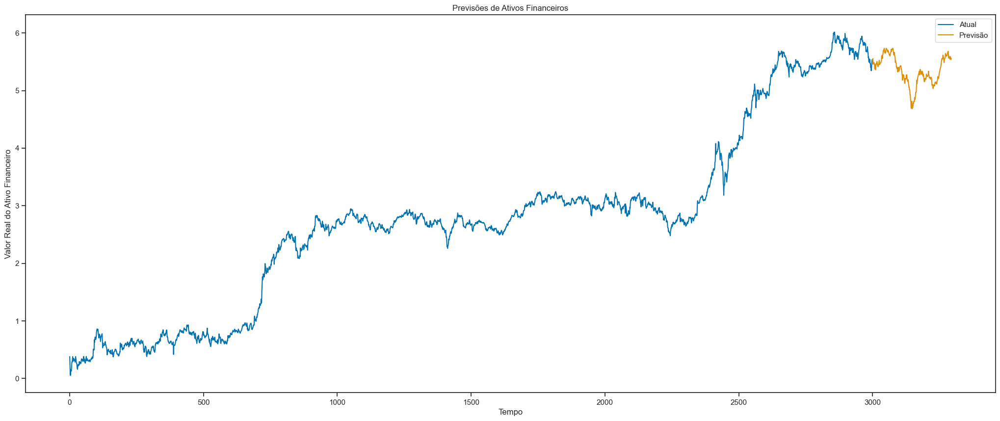

In [48]:
# Plot
plt.figure(figsize = (25.5, 10))
plt.plot(dados_treino_log, label = 'Dados de Treino')
plt.plot(dados_teste_log, label = 'Dados de Teste')
plt.title('Previsões de Ativos Financeiros')
plt.xlabel('Tempo')
plt.ylabel('Valor Real do Ativo Financeiro')
plt.legend(["Atual", "Previsão"])

In [49]:
# Calcular o erro RMSE
from sklearn.metrics import mean_squared_error

# Calcula o erro
rms = np.sqrt(mean_squared_error(dados_teste_log, previsoes))
print("RMSE : ", rms)

RMSE :  0.5370762682251298


In [50]:
# Salvando modelo série temporal - ARIMA
import pickle

# Salvar o modelo ARIMA em um arquivo
with open('modelo_arima.pkl', 'wb') as arquivo_modelo:
    pickle.dump(modelo, arquivo_modelo)

# Modelo ARIMA

In [51]:
# Converter a coluna "Date" para o formato de data
data_acoes['Date'] = pd.to_datetime(data_acoes['Date'])

In [52]:
# Criar uma série temporal com os dados da coluna "Close"
serie_temporal = data_acoes['Close']

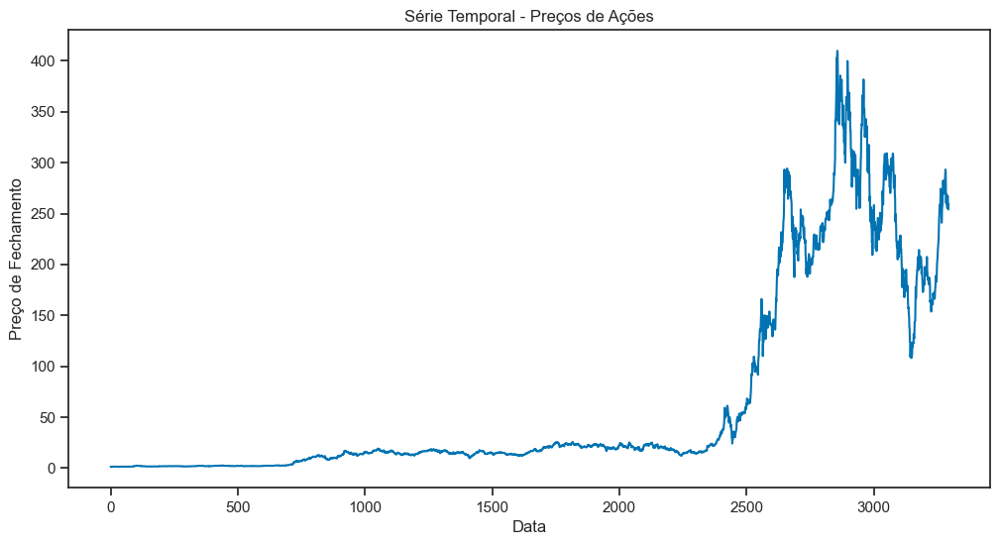

In [53]:
# Visualizar a série temporal
plt.figure(figsize=(12, 6))
plt.plot(serie_temporal)
plt.title('Série Temporal - Preços de Ações')
plt.xlabel('Data')
plt.ylabel('Preço de Fechamento')
plt.show()

In [54]:
# Verificar a estacionaridade da série temporal

from statsmodels.tsa.stattools import adfuller

def teste_adf(serie):
    resultado = adfuller(serie)
    print()
    print("Resultado do Teste Dickey-Fuller:")
    print()
    print("Estatística do Teste: {:.4f}".format(resultado[0]))
    print()
    print("Valor-p: {:.4f}".format(resultado[1]))
    print()
    print("Valores Críticos:")
    for chave, valor in resultado[4].items():
        print()
        print("\t{}: {:.4f}".format(chave, valor))

teste_adf(serie_temporal)


Resultado do Teste Dickey-Fuller:

Estatística do Teste: -0.7723

Valor-p: 0.8271

Valores Críticos:

	1%: -3.4324

	5%: -2.8624

	10%: -2.5672


Ser o valor-p for menor que 0.05 e a estatística do teste for menor que o valor crítico mais negativo, podemos considerar a série temporal estacionária.

In [55]:
serie_temporal_diferenciada = serie_temporal.diff().dropna()

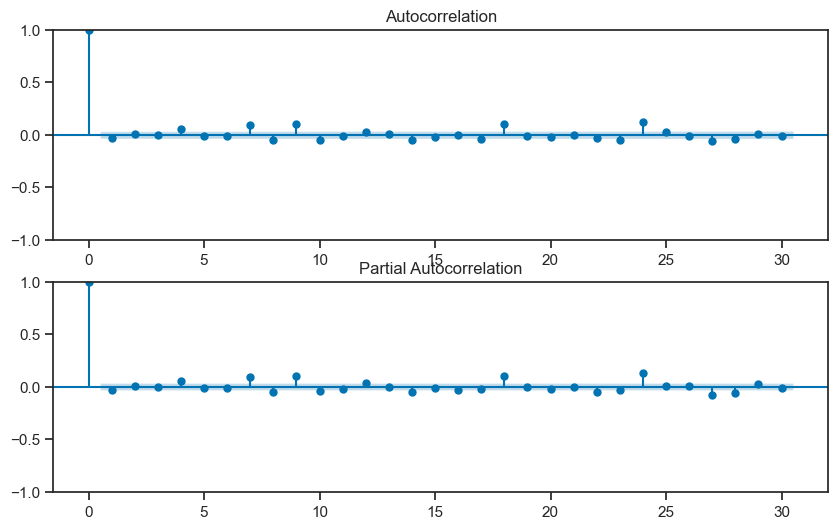

In [56]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Plot ACF e PACF para encontrar os valores de p e q
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 6))
plot_acf(serie_temporal_diferenciada, ax=ax1, lags=30)
plot_pacf(serie_temporal_diferenciada, ax=ax2, lags=30)
plt.show()

In [60]:
# Especificar os parâmetros do modelo ARIMA (p, d, q) e o número de períodos futuros para previsão (forecast_steps)
p = 1  # Ordem do termo autorregressivo
d = 1  # Ordem de diferenciação
q = 1  # Ordem do termo de média móvel
forecast_steps = 100  # Número de períodos futuros para previsão

# Ajustar o modelo ARIMA
modelo_arima = ARIMA(serie_temporal, order=(p, d, q))
resultado_arima = modelo_arima.fit()

In [61]:
# Fazer previsões para os períodos futuros
previsao = resultado_arima.forecast(steps=forecast_steps)
previsao

3295    259.076492
3296    259.195578
3297    259.137341
3298    259.165821
3299    259.151893
           ...    
3390    259.156467
3391    259.156467
3392    259.156467
3393    259.156467
3394    259.156467
Name: predicted_mean, Length: 100, dtype: float64

# Modelo SARIMA

In [62]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Especificar os parâmetros do modelo SARIMA (p, d, q) e (P, D, Q, S) e o número de períodos futuros para previsão (forecast_steps)
p = 1  # Ordem do termo autorregressivo (AR)
d = 1  # Ordem de diferenciação
q = 1  # Ordem do termo de média móvel (MA)
P = 1  # Ordem do termo autorregressivo sazonal (SAR)
D = 1  # Ordem de diferenciação sazonal
Q = 1  # Ordem do termo de média móvel sazonal (SMA)
S = 4  # Frequência da sazonalidade (por exemplo, 4 para dados mensais com sazonalidade anual)

# Ajustar o modelo SARIMA
modelo_sarima = SARIMAX(dados_treino_log,
                        order=(p, d, q),
                        seasonal_order=(P, D, Q, S))

resultado_sarima = modelo_sarima.fit()

In [63]:
# Fazer previsões para os períodos futuros
steps = 1000
previsao = resultado_sarima.forecast(steps=steps)
previsao

3000    5.532953
3001    5.536066
3002    5.537263
3003    5.538510
3004    5.539241
          ...   
3995    7.253474
3996    7.254204
3997    7.257638
3998    7.259157
3999    7.260389
Name: predicted_mean, Length: 1000, dtype: float64

In [64]:
# Criar a série de datas para os períodos futuros
ultima_data = serie_temporal.index[-1]
datas_previsao = pd.date_range(start=ultima_data, periods=steps + 1, freq='B')

In [65]:
datas_previsao

DatetimeIndex(['1970-01-01 00:00:00.000003294',
               '1970-01-02 00:00:00.000003294',
               '1970-01-05 00:00:00.000003294',
               '1970-01-06 00:00:00.000003294',
               '1970-01-07 00:00:00.000003294',
               '1970-01-08 00:00:00.000003294',
               '1970-01-09 00:00:00.000003294',
               '1970-01-12 00:00:00.000003294',
               '1970-01-13 00:00:00.000003294',
               '1970-01-14 00:00:00.000003294',
               ...
               '1973-10-19 00:00:00.000003294',
               '1973-10-22 00:00:00.000003294',
               '1973-10-23 00:00:00.000003294',
               '1973-10-24 00:00:00.000003294',
               '1973-10-25 00:00:00.000003294',
               '1973-10-26 00:00:00.000003294',
               '1973-10-29 00:00:00.000003294',
               '1973-10-30 00:00:00.000003294',
               '1973-10-31 00:00:00.000003294',
               '1973-11-01 00:00:00.000003294'],
              dtype=

# Processamento linguagem natural

In [66]:
import nltk
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\rafae\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [67]:
from dateutil import parser

data_nan['date'] = pd.to_datetime(data_nan['date'], utc=True)
data_nan['date'] = data_nan['date'].dt.date

data_nan

,date,site,text,link,growth
0,2022-07-28,Barrons.com,Fords Earnings Needed To Clear a High Bar. The...,https://www.barrons.com/articles/ford-earnings...,NaN
1,2022-07-28,Investor's Business Daily,"Tesla Stock Vs. BYD Stock: Tesla Bounces, Chin...",https://www.investors.com/news/tesla-stock-vs-...,NaN
2,2022-07-28,Motley Fool,Why Did Elon Musk Sell Tesla's Bitcoin?,https://www.fool.com/investing/2022/07/28/why-...,NaN
3,2022-07-28,Yahoo Finance Video,'We have woefully surrendered our energy indep...,https://finance.yahoo.com/video/woefully-surre...,NaN
4,2022-07-28,Yahoo Finance Video,Influencers with Andy Serwer: Bob Nardelli,https://finance.yahoo.com/video/influencers-an...,NaN
...,...,...,...,...,...
414,2022-07-16,Motley Fool,Tesla Sees Production Decline-Did Management O...,https://www.fool.com/investing/2022/07/16/tesl...,NaN
415,2022-07-16,Bloomberg,Porsches Luxury IPO Pitch Meets Investor Conce...,https://finance.yahoo.com/news/porsche-luxury-...,NaN
416,2022-07-15,LA Times,Elon Musk demands months for trial prep in Twi...,https://finance.yahoo.com/news/elon-musk-deman...,NaN
417,2022-07-15,Barrons.com,"Tesla, Ford, and GMs Plan to Unlock EV Battery...",https://www.barrons.com/articles/tesla-ford-gm...,NaN


In [68]:
# Vamos remover a coluna categoria pois não precisamos dela para nossa análise
data_nan.drop('site', axis = 1, inplace = True)
data_nan.drop('link', axis = 1, inplace = True)
data_nan.drop('growth', axis = 1, inplace = True)
data_nan

,date,text
0,2022-07-28,Fords Earnings Needed To Clear a High Bar. The...
1,2022-07-28,"Tesla Stock Vs. BYD Stock: Tesla Bounces, Chin..."
2,2022-07-28,Why Did Elon Musk Sell Tesla's Bitcoin?
3,2022-07-28,'We have woefully surrendered our energy indep...
4,2022-07-28,Influencers with Andy Serwer: Bob Nardelli
...,...,...
414,2022-07-16,Tesla Sees Production Decline-Did Management O...
415,2022-07-16,Porsches Luxury IPO Pitch Meets Investor Conce...
416,2022-07-15,Elon Musk demands months for trial prep in Twi...
417,2022-07-15,"Tesla, Ford, and GMs Plan to Unlock EV Battery..."


In [69]:
# Renomeando as colunas
data_nan.rename(columns={'date': 'Date', "text": "Text"}, inplace=True)
data_nan

,Date,Text
0,2022-07-28,Fords Earnings Needed To Clear a High Bar. The...
1,2022-07-28,"Tesla Stock Vs. BYD Stock: Tesla Bounces, Chin..."
2,2022-07-28,Why Did Elon Musk Sell Tesla's Bitcoin?
3,2022-07-28,'We have woefully surrendered our energy indep...
4,2022-07-28,Influencers with Andy Serwer: Bob Nardelli
...,...,...
414,2022-07-16,Tesla Sees Production Decline-Did Management O...
415,2022-07-16,Porsches Luxury IPO Pitch Meets Investor Conce...
416,2022-07-15,Elon Musk demands months for trial prep in Twi...
417,2022-07-15,"Tesla, Ford, and GMs Plan to Unlock EV Battery..."


In [70]:
# Removendo caracteres
data_nan.replace("[^a-zA-Z']", " ", regex = True, inplace = True)
data_nan["Text"].head(30)

0     Fords Earnings Needed To Clear a High Bar  The...
1     Tesla Stock Vs  BYD Stock  Tesla Bounces  Chin...
2               Why Did Elon Musk Sell Tesla's Bitcoin 
3     'We have woefully surrendered our energy indep...
4            Influencers with Andy Serwer  Bob Nardelli
5            Monster Growth Stocks Begging to Be Bought
6     Wary shoppers muddy outlook for tech  auto fir...
7     WRAPUP   Wary shoppers muddy outlook for tech ...
8     UPDATE   Panasonic's Q  profit hit by China lo...
9     UPDATE   Stellantis CEO says easing chip crunc...
10    Senate Deal Includes EV Tax Credits Sought by ...
11    Senate Deal Includes EV Tax Credits Sought by ...
12    Whats in the Manchin Schumer Deal on Taxes  Cl...
13    Tesla  The Downsides to Becoming a Mass Market...
14    Twitter accepts Oct     trial but is concerned...
15    Ford Stock Jumps As Auto Giant Affirms Outlook...
16    Fords Earnings Needed To Clear a High Bar  The...
17    Oracle's Larry Ellison Can Win Lawsuit Eve

In [71]:
# Removendo textos duplicados
data_nan.drop_duplicates(subset='Text', inplace=True)
data_nan

,Date,Text
0,2022-07-28,Fords Earnings Needed To Clear a High Bar The...
1,2022-07-28,Tesla Stock Vs BYD Stock Tesla Bounces Chin...
2,2022-07-28,Why Did Elon Musk Sell Tesla's Bitcoin
3,2022-07-28,'We have woefully surrendered our energy indep...
4,2022-07-28,Influencers with Andy Serwer Bob Nardelli
...,...,...
414,2022-07-16,Tesla Sees Production Decline Did Management O...
415,2022-07-16,Porsches Luxury IPO Pitch Meets Investor Conce...
416,2022-07-15,Elon Musk demands months for trial prep in Twi...
417,2022-07-15,Tesla Ford and GMs Plan to Unlock EV Battery...


In [72]:
# Substitua 'coluna_de_texto' pelo nome da coluna que contém os textos
data_nan.drop_duplicates(subset='Text', inplace=True)

In [73]:
data_nan.Text

0      Fords Earnings Needed To Clear a High Bar  The...
1      Tesla Stock Vs  BYD Stock  Tesla Bounces  Chin...
2                Why Did Elon Musk Sell Tesla's Bitcoin 
3      'We have woefully surrendered our energy indep...
4             Influencers with Andy Serwer  Bob Nardelli
                             ...                        
414    Tesla Sees Production Decline Did Management O...
415    Porsches Luxury IPO Pitch Meets Investor Conce...
416    Elon Musk demands months for trial prep in Twi...
417    Tesla  Ford  and GMs Plan to Unlock EV Battery...
418    How U S  Auto Makers Are Fighting for a Piece ...
Name: Text, Length: 395, dtype: object

In [74]:
%%time

from textblob import TextBlob

# Função para obter subjetividade
def getSubjectivity(text):
    if isinstance(text, str):  # Verifica se o dado é uma string
        return TextBlob(text).sentiment.subjectivity
    else:
        return 0.0  # Se não for uma string, retorne um valor padrão (ou qualquer valor adequado)

# Função para obter polaridade
def getPolarity(text):
    if isinstance(text, str):  # Verifica se o dado é uma string
        return TextBlob(text).sentiment.polarity
    else:
        return 0.0  # Se não for uma string, retorne um valor padrão (ou qualquer valor adequado)

# Adicionando ao dataframe
data_nan['Subjectivity'] = data_nan['Text'].apply(getSubjectivity)
data_nan['Polarity'] = data_nan['Text'].apply(getPolarity)
data_nan

CPU times: total: 31.2 ms
Wall time: 143 ms


,Date,Text,Subjectivity,Polarity
0,2022-07-28,Fords Earnings Needed To Clear a High Bar The...,0.461667,0.13
1,2022-07-28,Tesla Stock Vs BYD Stock Tesla Bounces Chin...,1.000000,0.00
2,2022-07-28,Why Did Elon Musk Sell Tesla's Bitcoin,0.000000,0.00
3,2022-07-28,'We have woefully surrendered our energy indep...,0.000000,0.00
4,2022-07-28,Influencers with Andy Serwer Bob Nardelli,0.000000,0.00
...,...,...,...,...
414,2022-07-16,Tesla Sees Production Decline Did Management O...,0.000000,0.00
415,2022-07-16,Porsches Luxury IPO Pitch Meets Investor Conce...,0.000000,0.00
416,2022-07-15,Elon Musk demands months for trial prep in Twi...,0.000000,0.00
417,2022-07-15,Tesla Ford and GMs Plan to Unlock EV Battery...,0.000000,0.00


In [75]:
!pip install vaderSentiment

In [76]:
%%time

from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Criando um analisador de sentimento
analisador = SentimentIntensityAnalyzer()

# Função para obter o compound score
def getCompound(text):
    if isinstance(text, str):  # Verifica se o dado é uma string
        return analisador.polarity_scores(text)['compound']
    else:
        return 0.0  # Se não for uma string, retorne um valor padrão (ou qualquer valor adequado)

# Função para obter o negative score
def getNegative(text):
    if isinstance(text, str):  # Verifica se o dado é uma string
        return analisador.polarity_scores(text)['neg']
    else:
        return 0.0  # Se não for uma string, retorne um valor padrão (ou qualquer valor adequado)

# Função para obter o neutral score
def getNeutral(text):
    if isinstance(text, str):  # Verifica se o dado é uma string
        return analisador.polarity_scores(text)['neu']
    else:
        return 0.0  # Se não for uma string, retorne um valor padrão (ou qualquer valor adequado)

# Função para obter o positive score
def getPositive(text):
    if isinstance(text, str):  # Verifica se o dado é uma string
        return analisador.polarity_scores(text)['pos']
    else:
        return 0.0  # Se não for uma string, retorne um valor padrão (ou qualquer valor adequado)

# Adicionando ao dataframe
data_nan['Compound'] = data_nan['Text'].apply(getCompound)
data_nan['Negative'] = data_nan['Text'].apply(getNegative)
data_nan['Neutral']  = data_nan['Text'].apply(getNeutral)
data_nan['Positive'] = data_nan['Text'].apply(getPositive)

# Visualiza
data_nan

CPU times: total: 109 ms
Wall time: 116 ms


,Date,Text,Subjectivity,Polarity,Compound,Negative,Neutral,Positive
0,2022-07-28,Fords Earnings Needed To Clear a High Bar The...,0.461667,0.13,0.3818,0.000,0.833,0.167
1,2022-07-28,Tesla Stock Vs BYD Stock Tesla Bounces Chin...,1.000000,0.00,0.0000,0.000,1.000,0.000
2,2022-07-28,Why Did Elon Musk Sell Tesla's Bitcoin,0.000000,0.00,0.0000,0.000,1.000,0.000
3,2022-07-28,'We have woefully surrendered our energy indep...,0.000000,0.00,-0.1531,0.229,0.593,0.178
4,2022-07-28,Influencers with Andy Serwer Bob Nardelli,0.000000,0.00,0.0000,0.000,1.000,0.000
...,...,...,...,...,...,...,...,...
414,2022-07-16,Tesla Sees Production Decline Did Management O...,0.000000,0.00,0.0000,0.000,1.000,0.000
415,2022-07-16,Porsches Luxury IPO Pitch Meets Investor Conce...,0.000000,0.00,0.0000,0.000,1.000,0.000
416,2022-07-15,Elon Musk demands months for trial prep in Twi...,0.000000,0.00,0.0000,0.000,1.000,0.000
417,2022-07-15,Tesla Ford and GMs Plan to Unlock EV Battery...,0.000000,0.00,0.0000,0.000,1.000,0.000


## Merge dos Dados Numéricos e de Texto

In [77]:
# Convertendo a coluna "Data" em tabela2 para datetime
data_nan['Date'] = pd.to_datetime(data_nan['Date'])
data_acoes['Date'] = pd.to_datetime(data_acoes['Date'])

In [78]:
# Fazendo o merge com base nas colunas "ID" e "Data"
data = pd.merge(data_acoes, data_nan, on=['Date'], how='inner')

# Salvando o dataset
data.to_csv("dataset_tesla.csv")

# Visualizando dataset
data.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Daily_Return,SMA_50,SMA_200,Text,Subjectivity,Polarity,Compound,Negative,Neutral,Positive
0,2022-07-15,240.000000,243.623337,236.889999,240.066666,240.066666,69683100,0.007357,240.807467,302.942633,Elon Musk demands months for trial prep in Twi...,0.0,0.0,0.0000,0.000,1.000,0.0
1,2022-07-15,240.000000,243.623337,236.889999,240.066666,240.066666,69683100,0.007357,240.807467,302.942633,Tesla Ford and GMs Plan to Unlock EV Battery...,0.0,0.0,0.0000,0.000,1.000,0.0
2,2022-07-15,240.000000,243.623337,236.889999,240.066666,240.066666,69683100,0.007357,240.807467,302.942633,How U S Auto Makers Are Fighting for a Piece ...,0.0,0.0,-0.3612,0.152,0.848,0.0
3,2022-07-18,244.936661,250.516663,239.603333,240.546661,240.546661,82537500,0.001999,239.267600,302.843183,UPDATE Tesla investors should vote against ...,0.0,0.0,0.0000,0.000,1.000,0.0
4,2022-07-18,244.936661,250.516663,239.603333,240.546661,240.546661,82537500,0.001999,239.267600,302.843183,Teslas Denholm Says Australia Is Key to Avoid ...,1.0,0.0,-0.2960,0.180,0.820,0.0


## Modelos Machine learning

In [79]:
# Dataframe com as variáveis que serão usadas para treinar os modelos

df_merge1 = data[['Close',
                      'Subjectivity',
                      'Polarity',
                      'Compound',
                      'Negative',
                      'Neutral',
                      'Positive']]

# Visualiza
df_merge1.head()

,Close,Subjectivity,Polarity,Compound,Negative,Neutral,Positive
0,240.066666,0.0,0.0,0.0000,0.000,1.000,0.0
1,240.066666,0.0,0.0,0.0000,0.000,1.000,0.0
2,240.066666,0.0,0.0,-0.3612,0.152,0.848,0.0
3,240.546661,0.0,0.0,0.0000,0.000,1.000,0.0
4,240.546661,1.0,0.0,-0.2960,0.180,0.820,0.0


In [80]:
# Colocamos a variável que é a série temporal em outro dataframe
df_time_series = df_merge1['Close']

# Variáveis exógenas
exog_data = df_merge1[['Subjectivity', 'Polarity', 'Compound', 'Negative', 'Neutral', 'Positive']]
exog_data

,Subjectivity,Polarity,Compound,Negative,Neutral,Positive
0,0.0,0.0,0.0000,0.000,1.000,0.000
1,0.0,0.0,0.0000,0.000,1.000,0.000
2,0.0,0.0,-0.3612,0.152,0.848,0.000
3,0.0,0.0,0.0000,0.000,1.000,0.000
4,1.0,0.0,-0.2960,0.180,0.820,0.000
...,...,...,...,...,...,...
354,0.0,0.0,0.3818,0.000,0.698,0.302
355,0.7,-0.5,0.0000,0.000,1.000,0.000
356,0.7,-0.5,0.0000,0.000,1.000,0.000
357,0.0,0.0,0.4404,0.000,0.775,0.225


In [81]:
# Variáveis de treino
final_train_data = df_time_series[:3000]
exog_train_data = exog_data[:3000]

In [82]:
exog_train_data.shape

(359, 6)

In [83]:
final_train_data.shape

(359,)

In [84]:
# Variáveis de teste
final_test_data = df_time_series[3000:]
exog_test_data = exog_data[3000:]

In [85]:
final_test_data.shape

(0,)

In [86]:
exog_test_data.shape

(0, 6)

# Treinamento modelo

In [87]:
# Prepara X (variáveis de entrada)
X = df_merge1.drop('Close', axis = 1)

# Prepara Y (variável de saída)
Y = df_merge1['Close']

In [88]:
# Divisão em treino e teste
x_treino, x_teste, y_treino, y_teste = train_test_split(X, Y, test_size = 0.2, random_state = 0)

In [89]:
x_treino.shape

(287, 6)

In [90]:
y_treino.shape

(287,)

## Modelagem com Modelos Supervisionados

Vamos padronizar os dados e então treinar os modelos.

In [91]:
# Cria o scaler para padronizar os dados
scaler = MinMaxScaler()

# Treinamento do scaler
modelo_scaler = scaler.fit(x_treino)

# Aplica em treino
x_treino = modelo_scaler.transform(x_treino)

# Aplica em teste
x_teste = modelo_scaler.transform(x_teste)

In [92]:
x_treino[10]

array([1.        , 0.41176471, 0.48415334, 0.        , 1.        ,
       0.        ])

In [93]:
x_teste[10]

array([0.        , 0.41176471, 0.48415334, 0.        , 1.        ,
       0.        ])

## Modelo Random Forest Regressor

In [94]:
# Cria o modelo
modelo_v2 = RandomForestRegressor()

# Treinamento
modelo_v2.fit(x_treino, y_treino)

RandomForestRegressor()

In [95]:
# Previsões
pred_v2 = modelo_v2.predict(x_teste)
pred_v2

array([259.08232488, 251.32589988, 260.87923665, 260.18250016,
       262.12390592, 259.08232488, 263.14259011, 264.154182  ,
       259.08232488, 253.73919793, 259.08232488, 263.44982231,
       263.91523729, 259.77490832, 252.38005447, 258.44513022,
       255.12163259, 253.89319829, 263.19103502, 259.08232488,
       254.1597978 , 256.17814615, 247.34093469, 266.53426302,
       264.46231632, 263.87386031, 265.8510346 , 267.51328694,
       262.77189304, 267.68350302, 266.82093659, 265.9868003 ,
       255.30860198, 268.4523977 , 260.69483134, 260.15729876,
       250.24169833, 266.27138206, 265.8510346 , 253.38193056,
       258.98856807, 264.37886676, 262.20420019, 259.08232488,
       251.62403116, 259.08232488, 259.00029686, 266.94479696,
       257.86223379, 262.45960509, 259.08232488, 259.08232488,
       255.42859604, 265.8510346 , 254.19126539, 264.154182  ,
       259.08232488, 264.99519815, 261.34316471, 264.84600153,
       259.08232488, 265.64605758, 254.59939311, 259.08

In [96]:
print('Root Mean Squared Error: ', sqrt(mean_squared_error(pred_v2, y_teste)))

Root Mean Squared Error:  12.964653780872284


## Modelo LGBM Regressor

In [97]:
# Cria o modelo
modelo_v3 = lightgbm.LGBMRegressor()

# Treinamento
modelo_v3.fit(x_treino, y_treino)

LGBMRegressor()

In [98]:
# Previsões
pred_v3 = modelo_v3.predict(x_teste)
pred_v3

array([259.19235646, 251.49705462, 261.07529804, 257.41607363,
       270.18182388, 259.19235646, 269.70727148, 260.04914398,
       259.19235646, 257.38947945, 259.19235646, 264.32518514,
       263.28492414, 263.74222044, 256.76456889, 259.46180967,
       253.25070106, 252.87252471, 259.27575957, 259.19235646,
       250.83726289, 253.31273748, 257.48149745, 265.42876679,
       268.15806522, 257.73953766, 265.91033191, 269.02848815,
       266.31099465, 266.53331724, 265.5786914 , 264.15274995,
       253.69090117, 272.57074709, 266.38618814, 256.66066618,
       250.96080738, 265.23624979, 265.91033191, 255.60732583,
       263.14490596, 259.2395287 , 265.76307439, 259.19235646,
       246.98092454, 259.19235646, 248.75299239, 265.62460354,
       257.25128224, 264.06033065, 259.19235646, 259.19235646,
       253.51209721, 265.91033191, 256.10312646, 260.04914398,
       259.19235646, 267.6404443 , 270.40648572, 262.45874823,
       259.19235646, 264.15929968, 256.93891137, 259.19

In [99]:
print('Root Mean Squared Error: ', sqrt(mean_squared_error(pred_v3, y_teste)))

Root Mean Squared Error:  14.116457950958898


## Modelo XGB Regressor

In [100]:
# Cria o modelo
modelo_v4 = xgboost.XGBRegressor(gpu_id=1,
                                 n_estimators=100,
                                 base_score=100)

# Treinamento
modelo_v4.fit(x_treino, y_treino)

[16:00:57] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\learner.cc:347: Only 1 GPUs are visible, setting `gpu_id` to 0


XGBRegressor(base_score=100, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=1, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [101]:
# Previsões
pred_v4 = modelo_v4.predict(x_teste)
pred_v4

array([259.0039 , 248.15648, 266.81583, 260.28714, 267.2593 , 259.0039 ,
       259.87256, 271.67484, 259.0039 , 254.66614, 259.0039 , 268.2823 ,
       263.97873, 263.37668, 254.55086, 259.3838 , 249.58464, 252.68492,
       259.42383, 259.0039 , 252.97205, 257.74182, 240.65762, 274.2207 ,
       251.36674, 260.41833, 266.13852, 273.27347, 256.26477, 267.75177,
       273.29703, 265.07166, 262.39362, 272.34973, 250.468  , 260.63315,
       252.40585, 255.9427 , 266.13852, 249.1117 , 261.73428, 263.06985,
       267.12744, 259.0039 , 265.46747, 259.0039 , 259.96448, 272.873  ,
       270.744  , 264.30203, 259.0039 , 259.0039 , 242.46326, 266.13852,
       249.40678, 271.67484, 259.0039 , 263.44287, 256.07062, 272.07526,
       259.0039 , 272.3749 , 243.43309, 259.0039 , 274.3592 , 271.16614,
       280.55148, 271.3862 , 240.65921, 264.31177, 248.35141, 270.9954 ],
      dtype=float32)

In [102]:
print('Root Mean Squared Error: ', sqrt(mean_squared_error(pred_v4, y_teste)))

Root Mean Squared Error:  14.704856053595183


## Modelos - Processamento linguagem natural

**Modelo NLP 1 - Word2Vec**

**Descrição:** Word2Vec é um algoritmo de aprendizado de máquina usado para representar palavras em um espaço vetorial denso. Ele foi proposto por Tomas Mikolov et al. em 2013 como uma maneira eficiente de capturar relações semânticas entre palavras. O modelo é amplamente utilizado no campo de processamento de linguagem natural (PLN) para mapear palavras em vetores numéricos, onde palavras semanticamente relacionadas são mapeadas para vetores próximos no espaço vetorial.

O princípio fundamental do Word2Vec é que as palavras que aparecem em contextos semelhantes tendem a ter significados semelhantes. Portanto, o modelo utiliza um treinamento não supervisionado em grandes quantidades de texto para aprender as representações vetoriais das palavras. Existem duas principais arquiteturas do Word2Vec:

CBOW (Continuous Bag of Words): Nesta abordagem, o modelo tenta prever uma palavra alvo a partir de um contexto (um conjunto de palavras vizinhas). O modelo recebe várias palavras de contexto e tenta prever a palavra alvo.

Skip-Gram: Nessa abordagem, o modelo tenta prever o contexto (ou palavras vizinhas) de uma palavra alvo. Ou seja, dado um determinado termo, o modelo tenta prever as palavras circundantes.

Ambas as arquiteturas são baseadas em redes neurais e usam uma camada intermediária (embedding) para representar as palavras em um espaço vetorial contínuo e denso. As representações resultantes capturam a semântica das palavras, permitindo que palavras semanticamente similares estejam mais próximas no espaço vetorial.

As representações vetoriais obtidas pelo Word2Vec têm várias aplicações, incluindo:

Medir similaridade semântica entre palavras.
Realizar operações de vetor que capturam relações entre palavras, como analogias (por exemplo, "rei" - "homem" + "mulher" resultando em "rainha").
Melhorar o desempenho de modelos de aprendizado de máquina em tarefas de PLN, fornecendo representações mais informativas das palavras.
O Word2Vec é uma das técnicas fundamentais para o processamento de linguagem natural e ajudou a impulsionar o avanço em várias tarefas relacionadas ao PLN. É uma técnica poderosa e muito usada em aplicações reais.

In [103]:
import nltk
from nltk.tokenize import word_tokenize
from gensim.models import Word2Vec

In [104]:
# Pré-processamento dos dados, se necessário
# Exemplo: converter para minúsculas e dividir o texto em palavras

nltk.download('punkt')
nltk.download('stopwords')

from nltk.corpus import stopwords

def preprocess_text(text):
    # Tokenização e remoção de pontuações
    tokens = word_tokenize(text.lower())

    # Remoção de stopwords
    stop_words = set(stopwords.words('english'))
    tokens = [token for token in tokens if token not in stop_words]

    return tokens

preprocessed_data = [preprocess_text(text) for text in data]

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\rafae\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\rafae\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [105]:
data['Text'] = data['Text'].str.lower()
data['Text'] = data['Text'].str.split()

In [106]:
# Crie uma lista de listas de tokens
sentences = data['Text'].tolist()

In [107]:
# Treine o modelo Word2Vec

# Importando biblioteca
from gensim.models import Word2Vec

# Criando modelo
model = Word2Vec(sentences,
                 window=5,
                 min_count=5,
                 workers=4)

In [108]:
# Salve o modelo treinado
model.save("modelo_word2vec.bin")

In [109]:
# Carregue o modelo treinado
model = Word2Vec.load("modelo_word2vec.bin")

# Obtenha o vetor de uma palavra específica
word_vector  = model.wv['musk']
print("Vetor da palavra 'musk':", word_vector)

Vetor da palavra 'musk': [-6.07779063e-03  6.48044108e-04  6.26429264e-03 -8.38500098e-04
  3.13229393e-03  3.23402858e-03  9.26792563e-04  5.80888707e-04
 -3.39633739e-03 -5.96890179e-03  7.64061697e-04 -7.10442197e-03
  1.09691966e-04  1.89818896e-03  1.76462100e-03 -9.18408186e-05
 -4.20963904e-03  8.99056497e-04  4.75164922e-03 -1.82176533e-03
  2.10995274e-03  2.54634884e-04 -7.34680751e-03 -1.27196385e-04
 -2.99161091e-03 -6.24965364e-03 -5.98950544e-03 -1.77413167e-03
  3.24998284e-03 -1.59336720e-03 -1.77351665e-03  1.86518661e-03
  3.01311142e-03  1.71927817e-03  2.05799052e-03 -2.86395382e-03
 -7.74942338e-03  4.77882475e-03  3.38896294e-03  1.53511320e-03
  8.83174507e-05  5.34631312e-03 -2.60357582e-03 -5.42059029e-03
  2.39632558e-03 -2.48545385e-03 -2.96018412e-03 -5.73450606e-03
 -1.01439271e-03  2.53249309e-04  2.44931522e-04  6.29684073e-04
 -3.25793796e-03 -5.41088358e-03  6.44945912e-03 -1.67411403e-03
 -6.42317533e-03 -7.89829064e-04  6.19517453e-03 -2.05974025e-03


In [110]:
# Obtenha o vetor de uma palavra específica
word_vector  = model.wv['tesla']
print("Vetor da palavra 'teslas':", word_vector)

Vetor da palavra 'teslas': [-5.9320177e-03 -5.1806105e-04  4.1728606e-03  7.3714014e-03
  5.0719660e-03 -1.6173066e-03  6.8023996e-03  3.4747657e-03
  2.0023398e-03 -2.7179311e-04 -2.2082533e-05 -2.5450417e-03
  1.7103472e-03 -6.6665781e-04 -7.4371020e-04 -5.3475043e-03
 -6.6596066e-04  2.2202095e-03  2.0785748e-03  4.0813093e-03
 -8.5366312e-03 -3.2390768e-03 -4.0657884e-03 -1.8020325e-03
 -2.4684765e-03 -4.4454434e-03 -6.6368557e-03 -7.7134062e-04
  1.0793441e-02 -4.0851993e-04  2.0975318e-04 -2.7372050e-03
 -2.1446859e-03  3.3066978e-03 -7.2916723e-03  4.6593756e-03
 -1.3387249e-03 -3.8353079e-05 -7.8069186e-03 -2.4691804e-03
 -4.4010156e-03  6.6105681e-03 -2.6855306e-04 -8.3419902e-05
  4.0454883e-03 -5.3395252e-03 -5.5812625e-03 -9.7027747e-03
  2.2214833e-03 -6.2309206e-03  9.5173129e-04  1.2917134e-03
  4.0540188e-03 -1.5434714e-03  4.5420933e-03 -1.3413961e-03
 -8.5187797e-03 -5.4541603e-03  6.6485764e-03 -2.6631850e-04
 -9.2929037e-04 -1.2701558e-03 -1.8937333e-03 -3.5517365e-

In [111]:
# Obtenha os vetores de palavras (embeddings) do modelo
word_vectors = model.wv

In [112]:
# Escolha algumas palavras para visualizar
words_to_plot = ["tesla",
                 "elon",
                 "musk",
                 "outlook",
                 "investors",
                 "bitcoin",
                 "ford",
                 "auto",
                 "ceo"]

In [113]:
# Obtenha os vetores de palavras para as palavras selecionadas
word_vectors_array = np.array([word_vectors[word] for word in words_to_plot])

In [114]:
from sklearn.manifold import TSNE

# Reduza a dimensionalidade dos vetores de palavras para 2D usando t-SNE
tsne = TSNE(n_components=3,
            perplexity=5,
            random_state=42)

# Treinamento modelo
word_vectors_tsne = tsne.fit_transform(word_vectors_array)

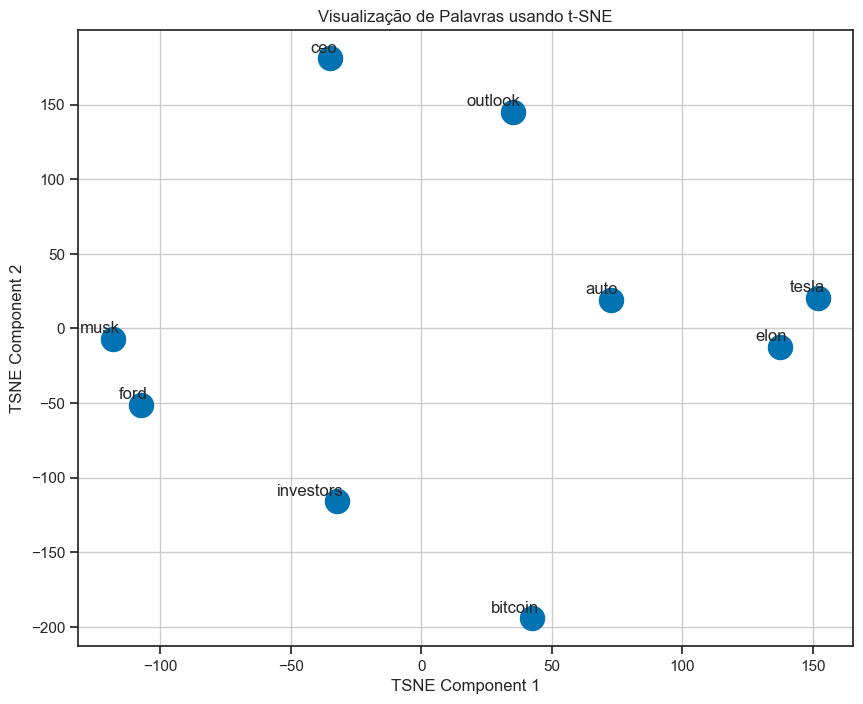

In [115]:
# Crie um gráfico de dispersão para plotar as palavras
plt.figure(figsize=(10, 8))
plt.scatter(word_vectors_tsne[:, 0],
            word_vectors_tsne[:, 1],
            marker='o',
            s=300)

# Adicione rótulos para cada ponto
for i, word in enumerate(words_to_plot):
    plt.annotate(word, xy=(word_vectors_tsne[i, 0],
                           word_vectors_tsne[i, 1]),
                 xytext=(5, 2),
                 textcoords='offset points',
                 ha='right',
                 va='bottom')

plt.xlabel('TSNE Component 1')
plt.ylabel('TSNE Component 2')
plt.title('Visualização de Palavras usando t-SNE')
plt.grid(True)
plt.show()

**Modelo NLP 2 - Doc2Vec**

**Descrição:** Doc2Vec, também conhecido como Paragraph Vector, é uma extensão do algoritmo Word2Vec que permite representar documentos inteiros em um espaço vetorial denso. Foi proposto por Tomas Mikolov et al. em 2014 como uma forma de estender as ideias do Word2Vec para capturar informações de contexto não apenas de palavras individuais, mas também de documentos completos.

Assim como o Word2Vec, o Doc2Vec é um modelo de aprendizado de máquina que utiliza treinamento não supervisionado em grandes quantidades de texto. A ideia central do Doc2Vec é adicionar um vetor adicional (conhecido como "vector doc") ao Word2Vec para representar documentos inteiros.

Existem duas principais abordagens para o Doc2Vec:

PV-DM (Paragraph Vector - Distributed Memory):
Nesta abordagem, o modelo tenta prever uma palavra alvo a partir de um contexto composto pelas palavras do documento e pelo "vector doc". O "vector doc" é tratado como uma palavra adicional no contexto do documento. Assim, o modelo aprende a capturar informações contextuais tanto de palavras individuais quanto do documento inteiro.

PV-DBOW (Paragraph Vector - Distributed Bag of Words):
Nesta abordagem, o modelo trata o "vector doc" como uma representação fixa para o documento inteiro. O objetivo é prever as palavras do documento a partir do "vector doc" apenas, ignorando as palavras individuais no processo de previsão. Essa abordagem é semelhante a um modelo de saco de palavras (Bag of Words), mas incorpora a informação do documento em um único vetor denso.

Assim como o Word2Vec, o Doc2Vec utiliza redes neurais para aprender as representações vetoriais. O modelo é treinado em um grande corpus de texto não rotulado e pode ser usado para representar documentos em vetores densos no espaço de características aprendido durante o treinamento.

As representações resultantes do Doc2Vec podem ser usadas para várias tarefas, como medir a similaridade entre documentos, encontrar documentos relacionados, agrupar documentos semelhantes e melhorar o desempenho de modelos de aprendizado de máquina em tarefas que envolvem documentos inteiros.

O Doc2Vec é uma ferramenta poderosa para o processamento de linguagem natural, especialmente quando se lida com análise de documentos e texto em que a representação de documentos inteiros é mais relevante do que a representação de palavras individuais.

In [116]:
from nltk.corpus import stopwords

def preprocess_text(text):
    # Tokenização e remoção de pontuações
    tokens = word_tokenize(text.lower())

    # Remoção de stopwords
    stop_words = set(stopwords.words('english'))
    tokens = [token for token in tokens if token not in stop_words]

    return tokens

In [117]:
from gensim.models.doc2vec import Doc2Vec, TaggedDocument

# Transformar os dados de texto em TaggedDocument para o treinamento do Doc2Vec
tagged_data = [TaggedDocument(words=text, tags=[str(i)]) for i, text in enumerate(data)]

In [118]:
# Importando doc2vec
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
from gensim.utils import simple_preprocess

# Modelo
# Crie o modelo Doc2Vec
model = Doc2Vec(vector_size=100,
                window=5,
                min_count=1,
                workers=4,
                epochs=100)

# Vocabulário do modelo
model.build_vocab(tagged_data)

# Treine o modelo
model.train(tagged_data,
            total_examples=model.corpus_count,
            epochs=model.epochs)

In [119]:
# Exemplo de uso do modelo
example_text = "musk bitcoin"

In [120]:
# Visualizando modelo
example_tokens = preprocess_text(example_text)
example_tokens

['musk', 'bitcoin']

In [121]:
# Visualizando os vectores
vector = model.infer_vector(example_tokens)
vector

array([-3.3457824e-03, -3.0579113e-03, -4.0599471e-03,  4.1355458e-03,
        1.5765592e-03, -4.4143219e-03, -2.9345441e-03,  9.2905037e-05,
        6.5781415e-04,  4.3207230e-03, -2.7654693e-03,  6.2334671e-04,
       -8.9515255e-05,  2.7716269e-03, -1.2790828e-03, -3.5517437e-03,
       -2.4703974e-03, -3.1020311e-03, -1.5466422e-04, -3.8315575e-03,
       -2.3749971e-03, -1.4056900e-03, -5.0088529e-05, -6.7203492e-04,
       -3.4796109e-03,  9.5445698e-04,  4.5715510e-03, -1.7916834e-03,
        3.9976663e-03,  2.2259455e-03,  7.5106800e-04,  1.7018018e-03,
        2.4969818e-03,  2.8374793e-03, -4.7509451e-04, -1.5741020e-03,
       -4.6381005e-03, -6.4768310e-04, -2.1871435e-03,  6.1086315e-04,
       -3.6964389e-03, -3.9428282e-03,  4.2827250e-03, -7.0987875e-04,
       -3.2505807e-03,  4.9296278e-03,  3.2743767e-03, -5.0247164e-04,
       -3.9638887e-04,  1.2729185e-03, -2.6268172e-03,  4.1293767e-03,
        4.2848913e-03,  4.6293722e-03, -9.6512062e-04,  4.9775043e-03,
      

In [122]:
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
from gensim.utils import simple_preprocess
from sklearn.manifold import TSNE
from bokeh.plotting import figure, show, output_file
from bokeh.models import HoverTool, ColumnDataSource

In [123]:
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
from gensim.utils import simple_preprocess
from sklearn.manifold import TSNE

# Pré-processamento dos textos
data['Text'] = data['Text'].apply(lambda text: simple_preprocess(' '.join(text)))

In [124]:
# Criar objetos TaggedDocument
tagged_data = [TaggedDocument(words=text, tags=[str(i)]) for i, text in enumerate(data['Text'])]

In [125]:
# Definir parâmetros do modelo
vector_size = 100  # Tamanho dos vetores de representação
window = 5  # Tamanho da janela de contexto
min_count = 1  # Frequência mínima de palavras para ser considerada no vocabulário
workers = 4  # Número de núcleos do processador para uso no treinamento

# Inicializar e treinar o modelo Doc2Vec
model = Doc2Vec(vector_size=vector_size, window=window, min_count=min_count, workers=workers)
model.build_vocab(tagged_data)
model.train(tagged_data, total_examples=model.corpus_count, epochs=30)

In [126]:
# Obter os vetores de texto para todos os documentos
vectors = [model.docvecs[str(i)] for i in range(len(tagged_data))]

In [127]:
# Converter a lista de vetores em um array NumPy
vectors_array = np.array(vectors)

# t-SNE

**Definição modelo**

O t-SNE (t-distributed Stochastic Neighbor Embedding) é uma técnica de redução de dimensionalidade amplamente utilizada para visualizar dados em um espaço de dimensão reduzida. Foi proposta por Laurens van der Maaten e Geoffrey Hinton em 2008.

O t-SNE é especialmente útil para visualizar dados de alta dimensão em um espaço bidimensional (ou tridimensional) enquanto mantém as relações de proximidade entre os pontos.

A ideia básica do t-SNE é transformar a similaridade entre os pontos de dados em probabilidades conjuntas, onde as similaridades mais próximas no espaço de alta dimensão têm maior probabilidade de serem agrupadas em conjunto no espaço de baixa dimensão.

Em outras palavras, o t-SNE tenta minimizar a divergência entre as distribuições de probabilidade de pares de pontos de dados no espaço de alta dimensão e no espaço de baixa dimensão.

O algoritmo t-SNE trabalha em duas etapas principais:

- Medição de similaridades: O t-SNE calcula as similaridades entre todos os pares de pontos de dados no espaço de alta dimensão. Geralmente, as similaridades são calculadas usando uma função de similaridade Gaussiana (baseada na distância Euclidiana) para pontos próximos e uma função de similaridade t-distribuída com uma dispersão maior para pontos mais distantes.

- Redução de dimensionalidade: O t-SNE mapeia os pontos de dados de alta dimensão para um espaço de dimensão menor (normalmente 2D ou 3D) de forma que a divergência entre as distribuições de probabilidade dos pares de pontos seja minimizada. Isso é feito usando técnicas de otimização para encontrar a melhor representação no espaço de baixa dimensão que preserva as relações de proximidade dos dados.

- O t-SNE é frequentemente usado para visualização de dados em aplicações como análise de agrupamento, análise de componentes principais, análise de dados de texto, análise de imagens e muito mais.

Uma das principais vantagens do t-SNE é que ele pode revelar padrões e agrupamentos em dados de alta dimensão que podem não ser facilmente perceptíveis em uma visualização de dimensão maior. No entanto, é importante lembrar que o t-SNE é sensível a vários parâmetros, e a interpretação dos resultados deve ser feita com cuidado.

Em resumo, o t-SNE é uma técnica de redução de dimensionalidade poderosa e popular usada para visualizar dados complexos em um espaço de dimensão menor, tornando-os mais acessíveis à análise e interpretação visual.

In [128]:
# Reduzir a dimensionalidade para 2D usando t-SNE
tsne = TSNE(n_components=2, random_state=42)
vectors_2d = tsne.fit_transform(vectors_array)

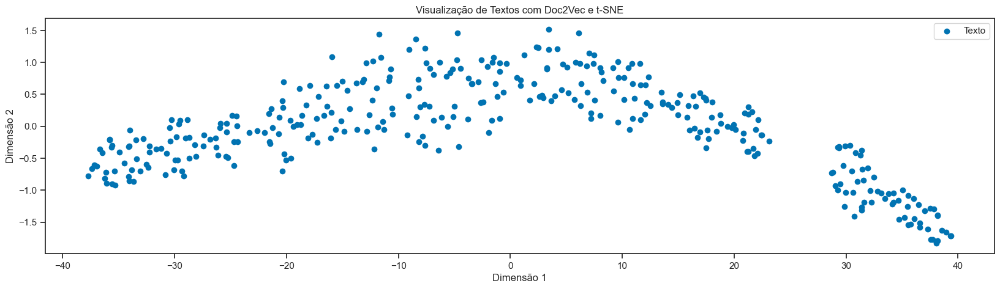

In [129]:
# Gráfico de dispersão para visualizar os textos em 2D
plt.figure(figsize=(20, 5))
plt.scatter(vectors_2d[:, 0],
            vectors_2d[:, 1])

plt.xlabel('Dimensão 1')
plt.ylabel('Dimensão 2')
plt.title('Visualização de Textos com Doc2Vec e t-SNE')
plt.legend(["Texto"])
plt.show()

In [130]:
import plotly.express as px

# Criar um DataFrame com os dados para o Plotly
data['x'] = vectors_2d[:, 0]
data['y'] = vectors_2d[:, 1]

# Criar lista de rótulos específicos para cada texto
text_labels = ["Texto " + str(i) + ": " + ' '.join(text) for i, text in enumerate(data['Text'])]

# Criar o gráfico com Plotly
fig = go.Figure()

# Adicionar os pontos ao gráfico e definir uma chave 'name' para cada grupo de pontos
fig.add_trace(go.Scatter(x=data['x'],
                         y=data['y'],
                         mode='markers',
                         text=text_labels,
                         marker=dict(size=8, opacity=0.8, line=dict(width=1)), name='Texto'))

# Personalizar o layout para evitar que os textos fiquem muito próximos
fig.update_layout(
    title='Visualização de Textos com Doc2Vec e t-SNE',
    hovermode='closest',
    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
    width=1000,  # Largura do gráfico em pixels
    height=850,  # Altura do gráfico em pixels
    showlegend=True  # Mostrar a legenda
)

# Exibir o gráfico interativo
fig.show()

# BART

**Definição**

BART (Bidirectional and Auto-Regressive Transformers) é um modelo de linguagem desenvolvido pela equipe de pesquisa da Facebook AI. É baseado na arquitetura de Transformer e é projetado para realizar tarefas de geração de linguagem, como resumo de texto, tradução automática e perguntas e respostas. O BART foi proposto pela primeira vez no artigo intitulado "BART: Denoising Sequence-to-Sequence Pre-training for Natural Language Generation, Translation, and Comprehension", publicado em 2019.

O BART combina as abordagens autoregressiva (AR) e bidirecional (BART) em um único modelo. Ele é treinado usando tarefas de denoising, onde um subconjunto de tokens do texto de entrada é mascarado e o modelo é treinado para prever esses tokens mascarados a partir do restante do texto. Essa tarefa de denoising ajuda o modelo a aprender representações eficazes e a capturar a estrutura subjacente dos dados.

O BART alcançou excelentes resultados em várias tarefas de processamento de linguagem natural, superando muitos modelos de linguagem anteriores em resumos de texto, tradução automática, geração de texto e outras tarefas. Sua flexibilidade e desempenho fizeram dele uma das referências em modelos de linguagem de última geração.

Além disso, o BART também foi usado como base para a criação de modelos mais especializados em tarefas específicas, transferindo seus conhecimentos pré-treinados para tarefas de fine-tuning (ajuste fino) em conjuntos de dados específicos.

No geral, o BART é um modelo poderoso e versátil que demonstrou excelentes resultados em uma variedade de tarefas de processamento de linguagem natural e continua sendo objeto de pesquisa e desenvolvimento no campo de aprendizado de máquina e inteligência artificial.

In [131]:
# Importando bibliotecas

# Importando biblioteca deep learning torch
import torch

# Importando bibliotecas bart
from transformers import BartTokenizer, BartForConditionalGeneration

In [132]:
# Carregar o tokenizer e o modelo pré-treinado BART
model_name = "facebook/bart-large-cnn"  # Você pode escolher outras variantes do BART também

# Carregando modelo treinado
model = BartForConditionalGeneration.from_pretrained(model_name)

# Tokenização modelo
tokenizer = BartTokenizer.from_pretrained(model_name)

In [135]:
# Pecorrendo
for text_list in data['Text']:

    for text in text_list:
        # Input tokenização texto
        inputs = tokenizer.encode("summarize: " + text,
                                  return_tensors="pt",
                                  max_length=1024,
                                  truncation=True)

        # Summary dos textos geração
        summary_ids = model.generate(inputs,
                                     max_length=50,
                                     min_length=40,
                                     length_penalty=2.0,
                                     num_beams=4,
                                     early_stopping=True)

        # Summmary textos
        summary = tokenizer.decode(summary_ids[0],skip_special_tokens=True)
        print(summary)
        print()
        # Separador entre sumários
        print("=" * 40)

summarize: elon.com will feature iReporter photos in a weekly Travel Snapshots gallery. Please submit your best shots of elon for next week's gallery. Visit elon's travel gallery for more photos

summarize: musk. summarize. musk: the smell of musk in the air.summarized. musks: the scent of musks in the atmosphere.

summarize: demands. Summarize the demands of the U.S. government. summarize. the demands. The demands. of the United States government. Summify. the demand.

summarize: months. months months months.summarized: months months weeks months. summarize. months weeks. months.months months. Summarize, months months, months.

summarize. for the first time. Summarize for the second time. For the third time, for the fourth time, the fourth and fifth times, the fifth time will be the same.

summarize: trial. summarize. trial. Summarize the trial. Trial.summarizing the trial, trial.Summarize The Trial: The Trial. The Trial, the Trial.

summarize: prep. summarize. prep. summary: prep, pr

summarize: iss iss.summarized: iss. summarize. iss. iss: iss, iss. Summarize, iss iss:  iss.Summarize! iss.

summarize: teslas. summarize. summaries. Summaries of the world's tesla systems. Summarize the world of teslas. Summs. Sums.

summarize: denholm.com: http://www.denholm.co.uk/en/news/features/2013/01/26/news-features/denholm-revelations-about-

summarize: says says he will not reveal what he plans to do with his time in the U.S. He says he has no immediate plans to return to the United States.

summarize: australia. Back to Mail Online home. back to the page you came from. Follow us on Twitter @dailymailonline and @MailOnlineernews. Back To the pageyou came from, back to

summarize: is is. is. Is. is, is, and is. It is. This is. this is this. Is this. is this? This. is that? This is what this is.

summarize: key. Key: Key is the key to unlocking the secrets of the world. Key is to unlock the secret to the world's secrets. key is the secret of unlocking the world’s secrets.

summ

KeyboardInterrupt: 

In [ ]:
# Adicione a lista de resumos gerados como uma nova coluna ao DataFrame
data['Generated_Summaries'] = generated_summaries

In [ ]:
# Gerar resumo usando o modelo BART
with torch.no_grad():
    generated_ids = model.generate(input_ids, max_length=150, num_beams=4, length_penalty=2.0, early_stopping=True)


In [ ]:
# Decodificar os IDs gerados para obter o resumo como texto
generated_text = tokenizer.decode(generated_ids[0], skip_special_tokens=True)
print(generated_text)

In [ ]:
# Salve o DataFrame atualizado em um novo arquivo CSV
data.to_csv('seuarquivo_com_sumarios.csv', index=False)

## **Extração tópicos LDA**

In [136]:
import gensim
from gensim import corpora
from gensim.models import LdaModel
from gensim.utils import simple_preprocess

import nltk
from nltk.corpus import stopwords

In [137]:
# Baixar as stopwords (se já não estiverem baixadas)
nltk.download('stopwords')

# Carregar as stopwords em inglês
stop_words = stopwords.words('english')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\rafae\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [138]:
data.Text

0      [elon, musk, demands, months, for, trial, prep...
1      [tesla, ford, and, gms, plan, to, unlock, ev, ...
2      [how, auto, makers, are, fighting, for, piece,...
3      [update, tesla, investors, should, vote, again...
4      [teslas, denholm, says, australia, is, key, to...
                             ...                        
354    [monster, growth, stocks, begging, to, be, bou...
355    [wary, shoppers, muddy, outlook, for, tech, au...
356    [wrapup, wary, shoppers, muddy, outlook, for, ...
357    [update, panasonic, profit, hit, by, china, lo...
358    [update, stellantis, ceo, says, easing, chip, ...
Name: Text, Length: 359, dtype: object

In [139]:
# Pré-processamento dos documentos
def preprocessamento(texto):
    # Tokenização e remoção de acentos
    return simple_preprocess(str(texto), deacc=True)

# Aplicando função de pré-processamento
data['texto_preprocessado'] = data['Text'].apply(preprocessamento)

In [140]:
# Criação do dicionário de palavras
documentos_preprocessados = data['texto_preprocessado'].tolist()
dicionario = corpora.Dictionary(documentos_preprocessados)

In [141]:
# Filtrar palavras irrelevantes e muito comuns
dicionario.filter_extremes(no_below=5, no_above=0.5, keep_n=100000)

In [142]:
# Criar o corpus (representação em bag-of-words dos documentos)
corpus = [dicionario.doc2bow(doc) for doc in documentos_preprocessados]

In [145]:
# Treinar o modelo LDA
num_topics = 10  # Número de tópicos desejados
modelo_lda = LdaModel(corpus, num_topics=num_topics, id2word=dicionario, passes=15)

# Visualizar os tópicos aprendidos
for idx, topic in modelo_lda.print_topics(-1):
    print()
    print(f'Tópico {idx}: {topic}')
    print()


Tópico 0: 0.130*"stocks" + 0.127*"to" + 0.072*"the" + 0.052*"buy" + 0.047*"tesla" + 0.042*"stock" + 0.026*"in" + 0.023*"top" + 0.022*"growth" + 0.022*"energy"


Tópico 1: 0.122*"earnings" + 0.072*"tesla" + 0.067*"on" + 0.057*"dow" + 0.055*"as" + 0.052*"jones" + 0.047*"stock" + 0.042*"market" + 0.033*"netflix" + 0.032*"stocks"


Tópico 2: 0.127*"tesla" + 0.123*"bitcoin" + 0.060*"of" + 0.059*"its" + 0.050*"in" + 0.033*"crash" + 0.029*"sales" + 0.029*"sells" + 0.029*"sold" + 0.025*"update"


Tópico 3: 0.104*"tesla" + 0.073*"stock" + 0.052*"and" + 0.052*"in" + 0.035*"of" + 0.028*"the" + 0.026*"today" + 0.026*"why" + 0.026*"earnings" + 0.025*"market"


Tópico 4: 0.177*"musk" + 0.119*"elon" + 0.095*"twitter" + 0.076*"on" + 0.057*"to" + 0.043*"with" + 0.037*"in" + 0.032*"trial" + 0.029*"and" + 0.020*"affair"


Tópico 5: 0.096*"is" + 0.078*"the" + 0.072*"tesla" + 0.063*"to" + 0.050*"ev" + 0.046*"says" + 0.037*"of" + 0.034*"in" + 0.031*"stock" + 0.031*"after"


Tópico 6: 0.096*"investors" + 0.

In [147]:
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
pyLDAvis.enable_notebook()

In [149]:
# feed the LDA model into the pyLDAvis instance
lda_viz = gensimvis.prepare(modelo_lda, corpus, dicionario)
lda_viz

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1     -0.225633 -0.108267       1        1  16.204413
5      0.035310 -0.059923       2        1  12.846831
0     -0.053179 -0.156690       3        1  10.964362
3     -0.119916 -0.038759       4        1  10.653975
4      0.263422 -0.027365       5        1  10.479740
2     -0.072005  0.182348       6        1   9.989032
8      0.178840 -0.078115       7        1   9.703778
7      0.006945  0.111796       8        1   8.522347
9     -0.047146  0.094384       9        1   5.738679
6      0.033362  0.080590      10        1   4.896843, topic_info=        Term       Freq      Total Category  logprob  loglift
3       musk  72.000000  72.000000  Default  30.0000  30.0000
0       elon  48.000000  48.000000  Default  29.0000  29.0000
43    stocks  48.000000  48.000000  Default  28.0000  28.0000
5    twitter  33.000000  33.000000  Default  27.0000  27.0000
72   bitcoin  37.000000  37.000000  Default  26.0000  26.0000
..       ...        ...        ...      ...      ...      ...
29        on   3.112787  57.647603  Topic10  -3.5693   0.0977
35  earnings   1.402502  73.605709  Topic10  -4.3665  -0.9439
6        and   1.252036  38.086757  Topic10  -4.4800  -0.3985
16        of   1.277168  50.933388  Topic10  -4.4601  -0.6693
17       the   1.294907  64.446184  Topic10  -4.4463  -0.8908

[392 rows x 6 columns], token_table=      Topic      Freq    Term
term                         
59        4  0.462026   about
59        7  0.308017   about
59       10  0.154009   about
146       5  0.882512  affair
121       1  0.366175   after
...     ...       ...     ...
67        9  0.048183    with
96        3  0.153589   worth
96        4  0.460766   worth
96        7  0.153589   worth
96       10  0.153589   worth

[438 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 6, 1, 4, 5, 3, 9, 8, 10, 7])

In [150]:
# Classificar novos documentos em tópicos
novo_documento = "A new document to classify into topics."
novo_documento_preprocessado = preprocessamento(novo_documento)
novo_documento_bow = dicionario.doc2bow(novo_documento_preprocessado)
topicos_novo_documento = modelo_lda.get_document_topics(novo_documento_bow)
print(f'Tópicos do novo documento: {topicos_novo_documento}')
topicos_novo_documento

Tópicos do novo documento: [(0, 0.47316283), (1, 0.025000002), (2, 0.025001563), (3, 0.025), (4, 0.025001822), (5, 0.02501083), (6, 0.025001816), (7, 0.32680994), (8, 0.025010154), (9, 0.025001083)]


[(0, 0.47316283),
 (1, 0.025000002),
 (2, 0.025001563),
 (3, 0.025),
 (4, 0.025001822),
 (5, 0.02501083),
 (6, 0.025001816),
 (7, 0.32680994),
 (8, 0.025010154),
 (9, 0.025001083)]

In [151]:
# Obter a distribuição de tópicos para cada documento
distribuicao_topicos = [modelo_lda.get_document_topics(corpus_item) for corpus_item in corpus]

# Contagem dos tópicos
contagem_topicos = [0] * num_topics
for doc in distribuicao_topicos:
    for topic, _ in doc:
        contagem_topicos[topic] += 1
contagem_topicos

[324, 339, 328, 330, 328, 326, 324, 323, 331, 325]

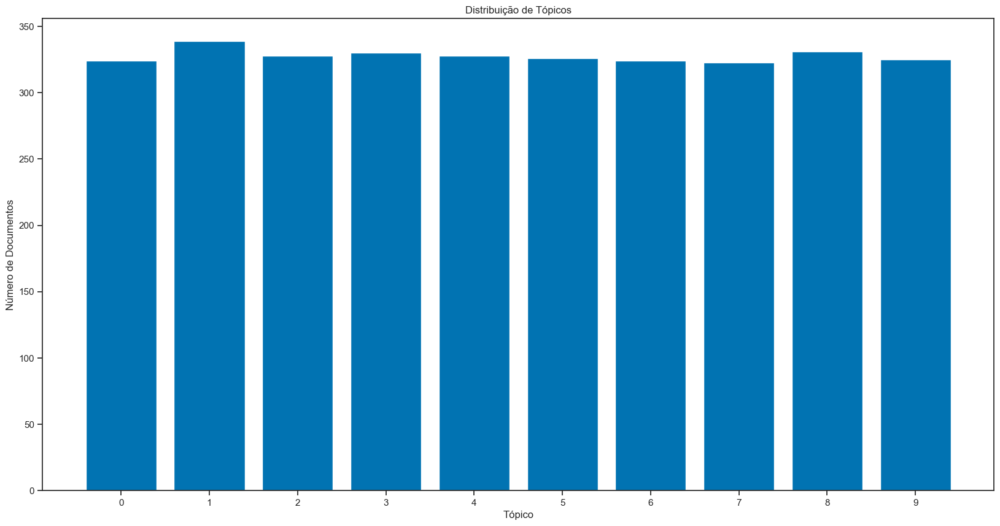

In [152]:
# Plotar gráfico de barras
plt.figure(figsize=(20, 10))
plt.bar(range(num_topics), contagem_topicos, align='center')
plt.xlabel('Tópico')
plt.ylabel('Número de Documentos')
plt.title('Distribuição de Tópicos')
plt.xticks(range(num_topics))
plt.show()

C:\Users\rafae\anaconda3\lib\site-packages\wordcloud\wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



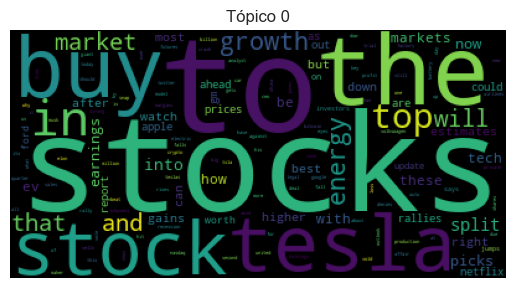

C:\Users\rafae\anaconda3\lib\site-packages\wordcloud\wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



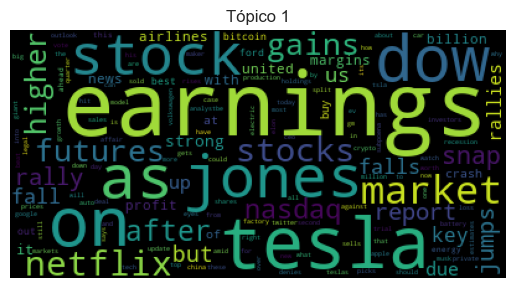

C:\Users\rafae\anaconda3\lib\site-packages\wordcloud\wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



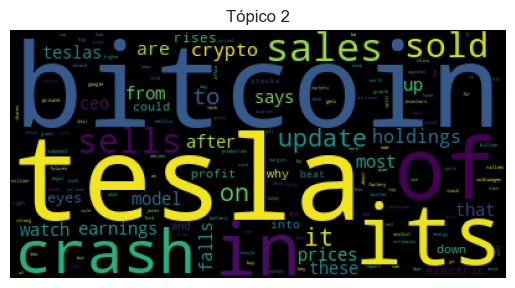

C:\Users\rafae\anaconda3\lib\site-packages\wordcloud\wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



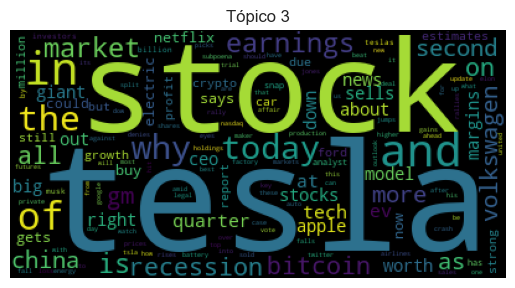

C:\Users\rafae\anaconda3\lib\site-packages\wordcloud\wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



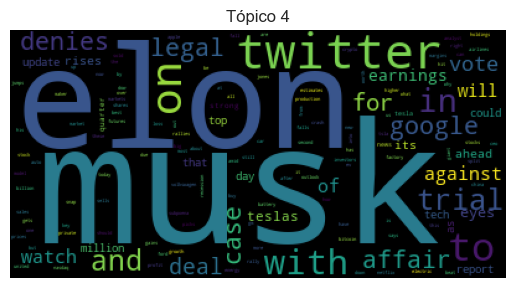

C:\Users\rafae\anaconda3\lib\site-packages\wordcloud\wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



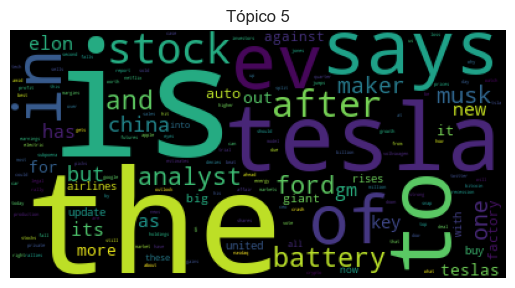

C:\Users\rafae\anaconda3\lib\site-packages\wordcloud\wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



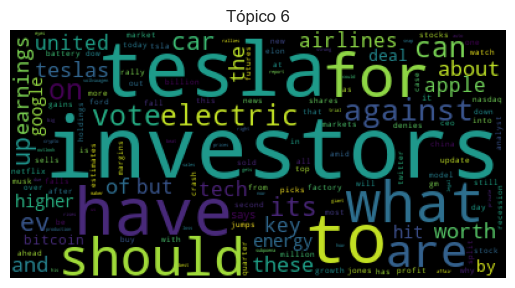

C:\Users\rafae\anaconda3\lib\site-packages\wordcloud\wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



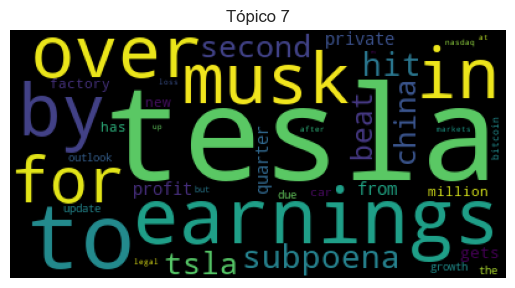

C:\Users\rafae\anaconda3\lib\site-packages\wordcloud\wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



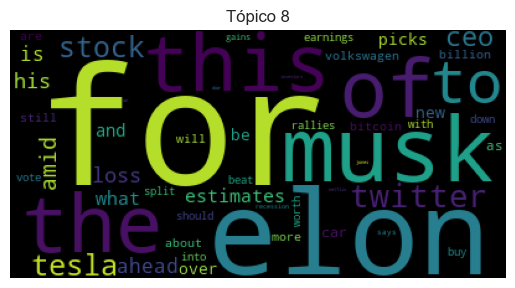

C:\Users\rafae\anaconda3\lib\site-packages\wordcloud\wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



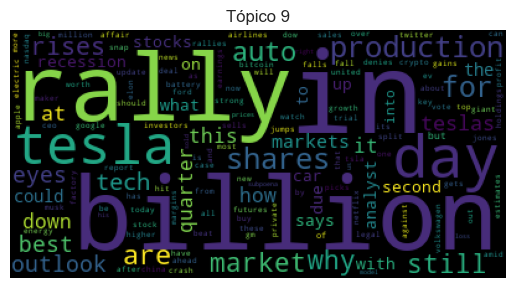

In [153]:
from wordcloud import WordCloud

# Gerar gráficos de nuvem de palavras para cada tópico
for idx, topic in modelo_lda.print_topics(-1):
    plt.figure()
    plt.imshow(WordCloud().fit_words(dict(modelo_lda.show_topic(idx, 200))))
    plt.title(f'Tópico {idx}')
    plt.axis("off")
    plt.show()

## **BART Topics**

In [154]:
import torch
import gensim
import string
import nltk

from gensim import corpora
from gensim.models import LdaModel
from transformers import BertTokenizer, BertModel

from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

nltk.download('stopwords')
nltk.download('punkt')

stop_words = set(stopwords.words('english'))
punctuation = set(string.punctuation)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\rafae\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\rafae\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [157]:
dictionary = corpora.Dictionary(data['texto_preprocessado'])
corpus = [dictionary.doc2bow(doc) for doc in data['texto_preprocessado']]

In [171]:
num_topics = 25  # Defina o número de tópicos desejado
lda_model = LdaModel(corpus, id2word=dictionary, num_topics=num_topics)

C:\Users\rafae\anaconda3\lib\site-packages\gensim\models\ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\rafae\anaconda3\lib\site-packages\gensim\models\ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\rafae\anaconda3\lib\site-packages\gensim\models\ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\rafae\anaconda3\lib\site-packages\gensim\models\ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the pytho

C:\Users\rafae\anaconda3\lib\site-packages\gensim\models\ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\rafae\anaconda3\lib\site-packages\gensim\models\ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\rafae\anaconda3\lib\site-packages\gensim\models\ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\rafae\anaconda3\lib\site-packages\gensim\models\ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the pytho

In [172]:
import torch
from transformers import BertTokenizer

tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
tokenizer

BertTokenizer(name_or_path='bert-base-uncased', vocab_size=30522, model_max_length=512, is_fast=False, padding_side='right', truncation_side='right', special_tokens={'unk_token': '[UNK]', 'sep_token': '[SEP]', 'pad_token': '[PAD]', 'cls_token': '[CLS]', 'mask_token': '[MASK]'}, clean_up_tokenization_spaces=True)

In [173]:
from transformers import BertModel

bert_model = BertModel.from_pretrained('bert-base-uncased')
bert_model

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.transform.dense.bias', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


BertModel(
  (embeddings): BertEmbeddings(
    (word_embeddings): Embedding(30522, 768, padding_idx=0)
    (position_embeddings): Embedding(512, 768)
    (token_type_embeddings): Embedding(2, 768)
    (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
    (dropout): Dropout(p=0.1, inplace=False)
  )
  (encoder): BertEncoder(
    (layer): ModuleList(
      (0-11): 12 x BertLayer(
        (attention): BertAttention(
          (self): BertSelfAttention(
            (query): Linear(in_features=768, out_features=768, bias=True)
            (key): Linear(in_features=768, out_features=768, bias=True)
            (value): Linear(in_features=768, out_features=768, bias=True)
            (dropout): Dropout(p=0.1, inplace=False)
          )
          (output): BertSelfOutput(
            (dense): Linear(in_features=768, out_features=768, bias=True)
            (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
            (dropout): Dropout(p=0.1, inplace=False)
  

In [174]:
%%time

def get_bert_representation(text):
    inputs = tokenizer(text, return_tensors='pt', padding=True, truncation=True)
    with torch.no_grad():
        outputs = bert_model(**inputs)
    return outputs.last_hidden_state.mean(dim=1).numpy()

data['bert_representation'] = data['Text'].apply(get_bert_representation)
data.bert_representation

CPU times: total: 10.6 s
Wall time: 21 s


0      [[0.12079103, -0.06459947, -0.05705771, -0.020...
1      [[0.035101816, 0.056724384, -0.121282056, 0.05...
2      [[-0.05419904, 0.035872146, -0.029701462, 0.13...
3      [[0.10366454, -0.0870395, -0.13411795, -0.1651...
4      [[0.50588715, -0.07368279, -0.14464776, 0.1391...
                             ...                        
354    [[0.16146432, -0.14736432, -0.2188348, -0.0383...
355    [[0.09986459, 0.15098059, -0.049293816, 0.0272...
356    [[0.24766366, -0.37247562, 0.06296043, 0.18356...
357    [[-0.13409683, -0.1489209, 0.010732266, -0.058...
358    [[-0.13409683, -0.1489209, 0.010732266, -0.058...
Name: bert_representation, Length: 359, dtype: object

In [175]:
combined_features = []
for doc, bert_rep in zip(corpus, data['bert_representation']):
    lda_probs = [prob for _, prob in lda_model.get_document_topics(doc)]
    combined_features.append(lda_probs + bert_rep.tolist())

data['combined_features'] = combined_features
data.combined_features

0      [0.92615384, [0.12079103291034698, -0.06459946...
1      [0.9127273, [0.035101816058158875, 0.056724384...
2      [0.92615384, [-0.054199039936065674, 0.0358721...
3      [0.92, [0.10366453975439072, -0.08703950047492...
4      [0.92, [0.5058871507644653, -0.073682792484760...
                             ...                        
354    [0.88, [0.16146431863307953, -0.14736431837081...
355    [0.9127273, [0.09986458718776703, 0.1509805917...
356    [0.92, [0.24766366183757782, -0.37247562408447...
357    [0.9127273, [-0.13409683108329773, -0.14892089...
358    [0.92615384, [-0.13409683108329773, -0.1489208...
Name: combined_features, Length: 359, dtype: object

In [176]:
# Exibir os textos e as features combinadas
for idx, row in data.iterrows():
    print(f"Texto: {row['Text']}")
    print(f"Features Combinadas: {row['combined_features']}")
    print("=" * 50)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Features Combinadas: [0.92615384, [-0.13409683108329773, -0.14892089366912842, 0.010732266120612621, -0.058689285069704056, -0.020723966881632805, -0.08403588831424713, 0.21675710380077362, 0.3118465840816498, -0.006635521538555622, -0.38109007477760315, 0.09755859524011612, 0.04251471906900406, -0.1832679957151413, 0.04949120432138443, -0.012432068586349487, -0.017539799213409424, -0.08789089322090149, 0.25859034061431885, 0.391912579536438, 0.20171931385993958, 0.13641400635242462, -0.2224242240190506, -0.24912889301776886, -0.05502469465136528, 0.06254265457391739, 0.3793049454689026, -0.14774301648139954, -0.014355331659317017, -0.5251339673995972, 0.11399104446172714, -0.08745457977056503, -0.542474091053009, 0.16937610507011414, 0.4193170666694641, -0.14938713610172272, -0.07903843373060226, -0.2311069220304489, -0.03611333295702934, -0.2913815379142761, 0.025470202788710594, -0.2043267786502838, -0.28373852372169495, 0.29930487275123596, 0.08536676317453384, 0.23303425312042236,

C:\Users\rafae\anaconda3\lib\site-packages\wordcloud\wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



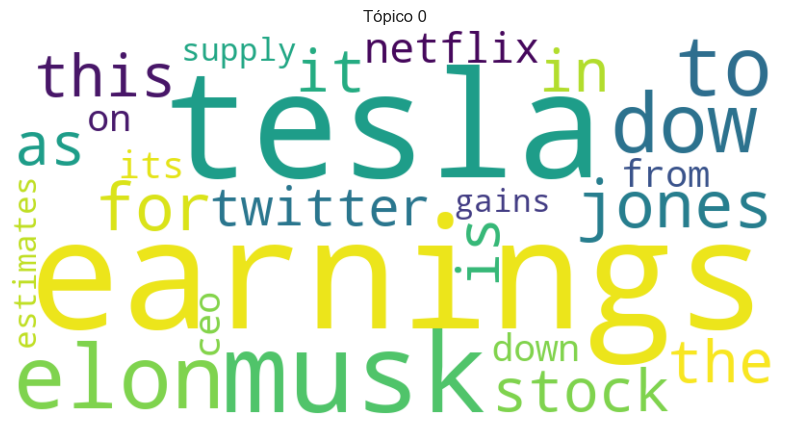

C:\Users\rafae\anaconda3\lib\site-packages\wordcloud\wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



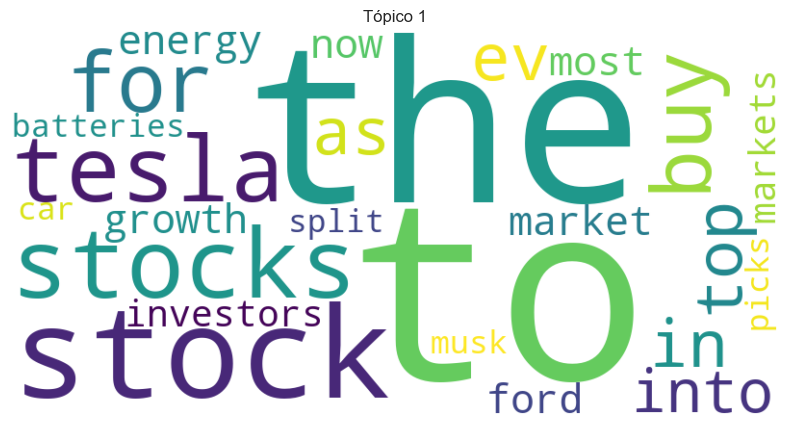

C:\Users\rafae\anaconda3\lib\site-packages\wordcloud\wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



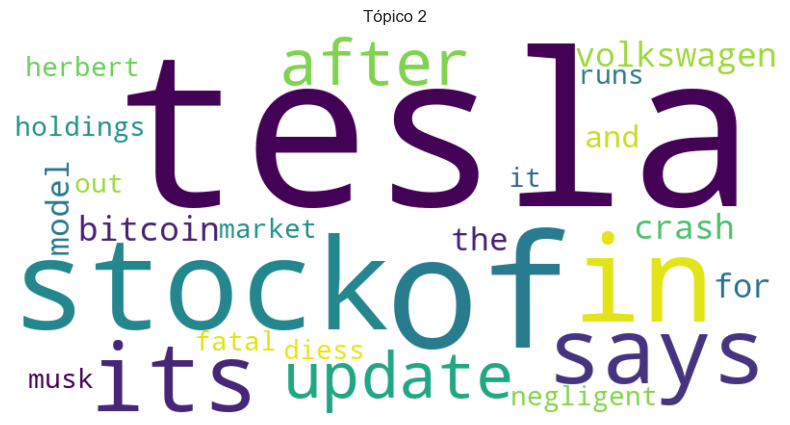

C:\Users\rafae\anaconda3\lib\site-packages\wordcloud\wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



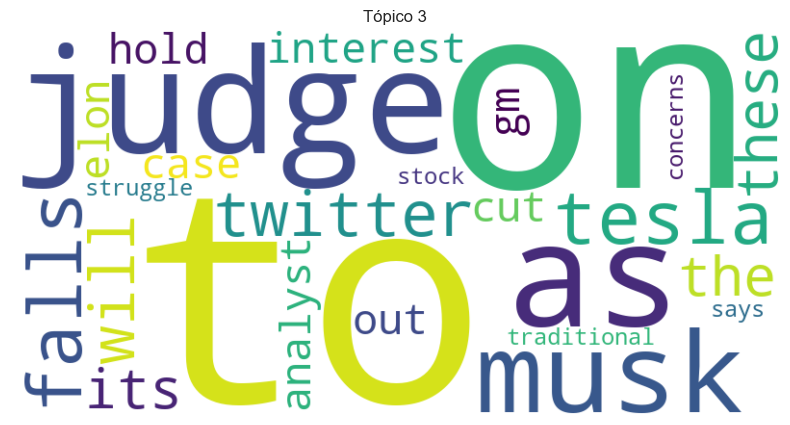

C:\Users\rafae\anaconda3\lib\site-packages\wordcloud\wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



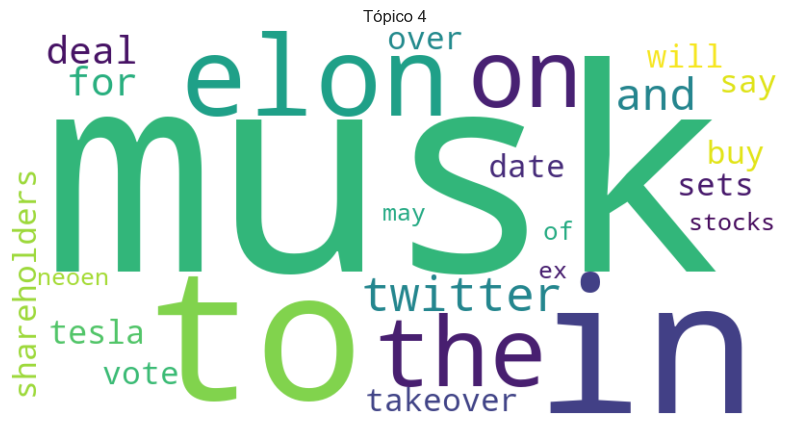

C:\Users\rafae\anaconda3\lib\site-packages\wordcloud\wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



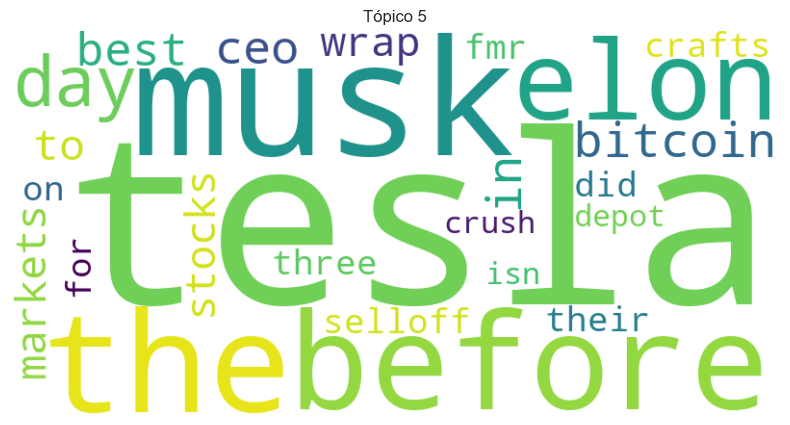

C:\Users\rafae\anaconda3\lib\site-packages\wordcloud\wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



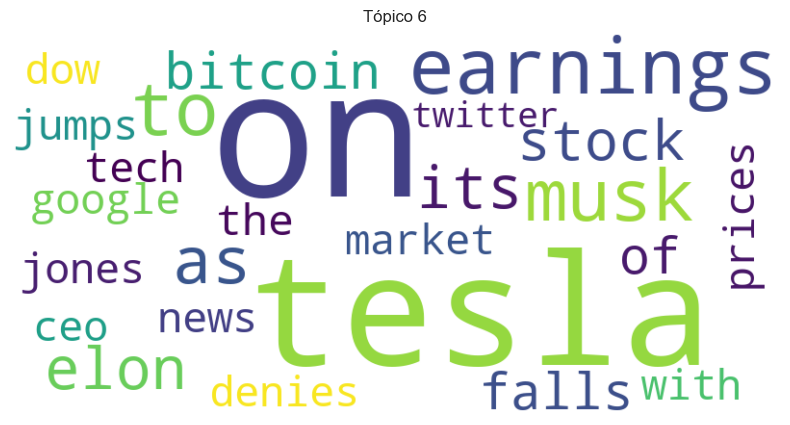

C:\Users\rafae\anaconda3\lib\site-packages\wordcloud\wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



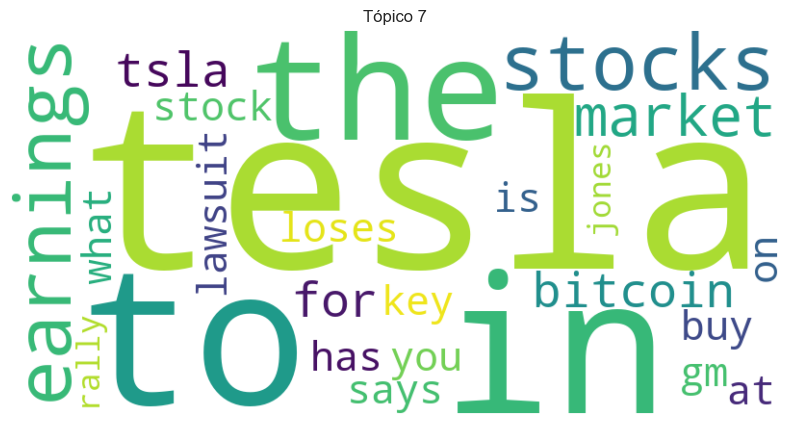

C:\Users\rafae\anaconda3\lib\site-packages\wordcloud\wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



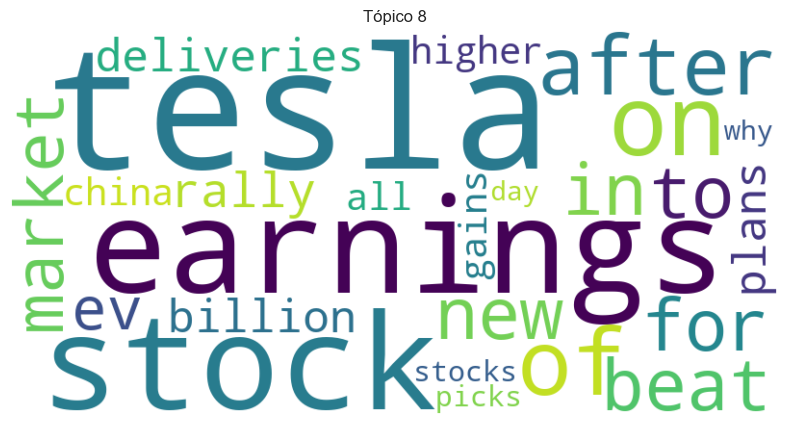

C:\Users\rafae\anaconda3\lib\site-packages\wordcloud\wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



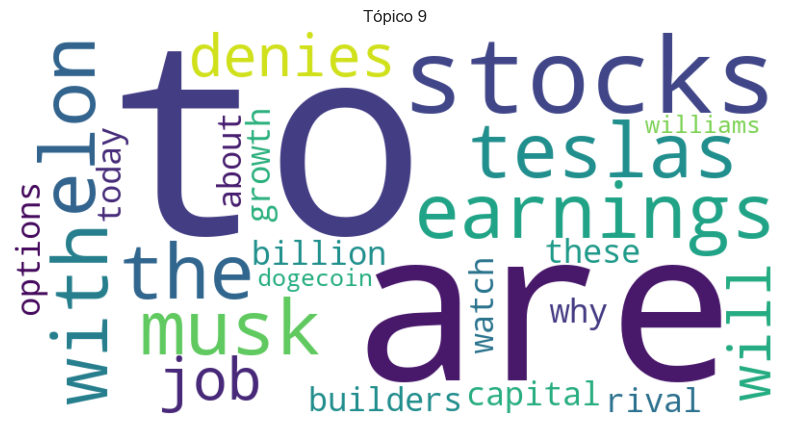

C:\Users\rafae\anaconda3\lib\site-packages\wordcloud\wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



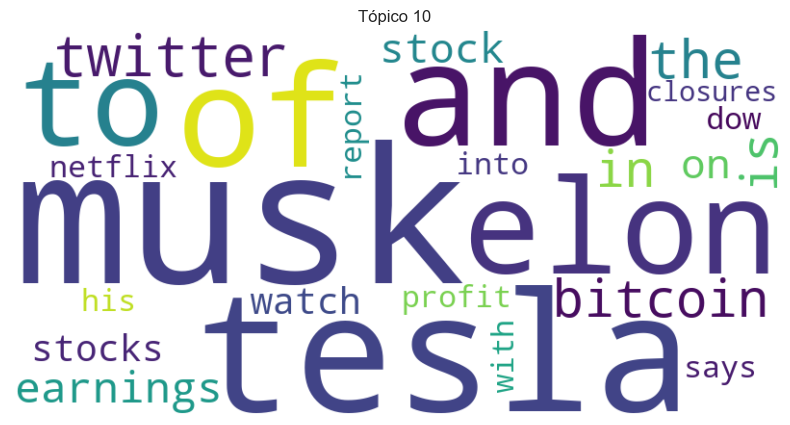

C:\Users\rafae\anaconda3\lib\site-packages\wordcloud\wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



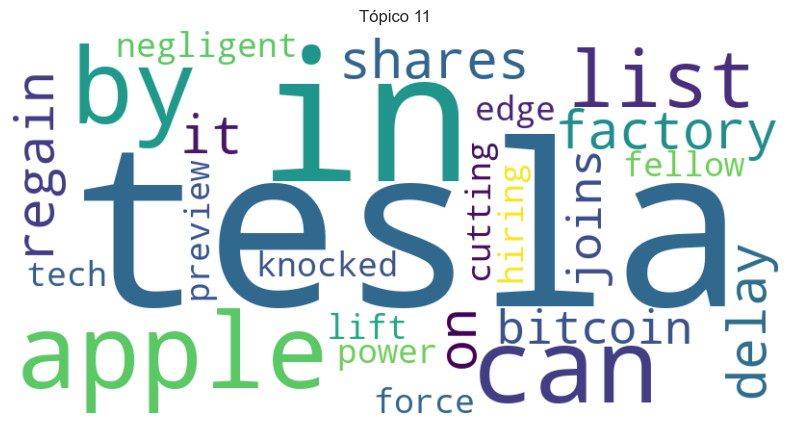

C:\Users\rafae\anaconda3\lib\site-packages\wordcloud\wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



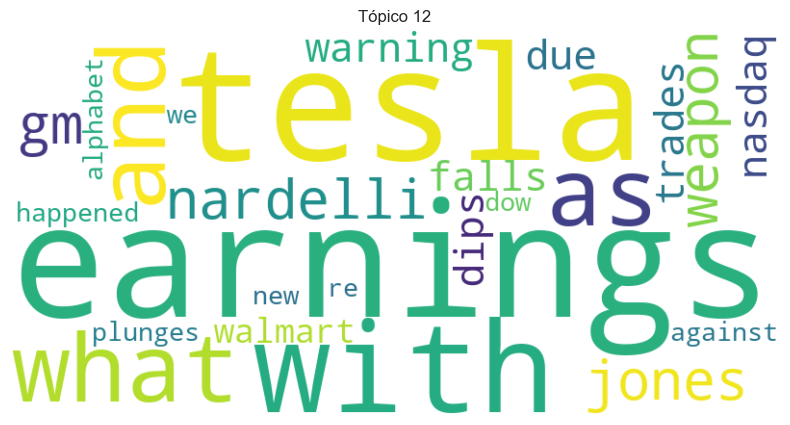

C:\Users\rafae\anaconda3\lib\site-packages\wordcloud\wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



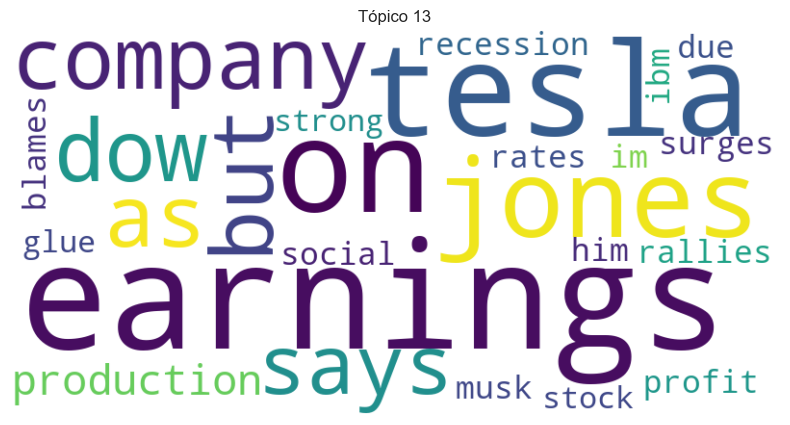

C:\Users\rafae\anaconda3\lib\site-packages\wordcloud\wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



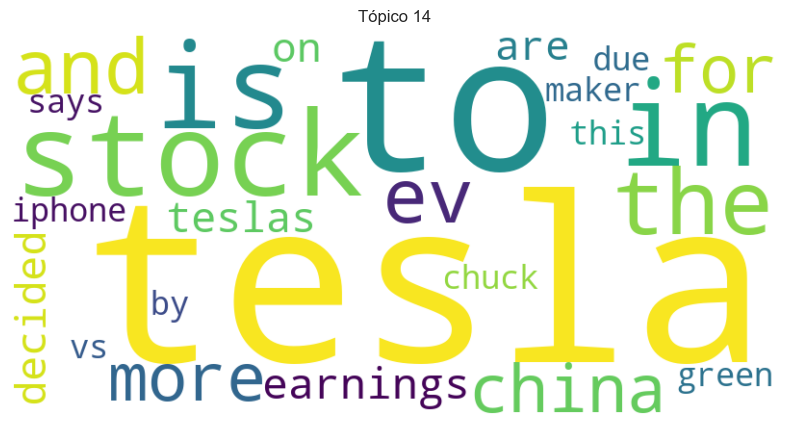

C:\Users\rafae\anaconda3\lib\site-packages\wordcloud\wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



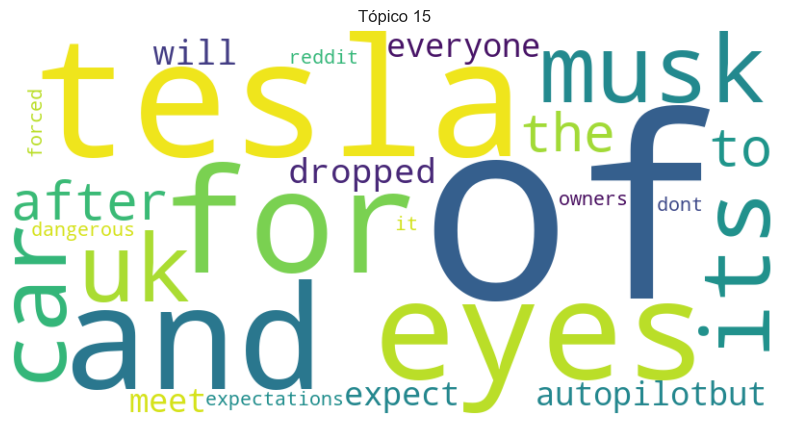

C:\Users\rafae\anaconda3\lib\site-packages\wordcloud\wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



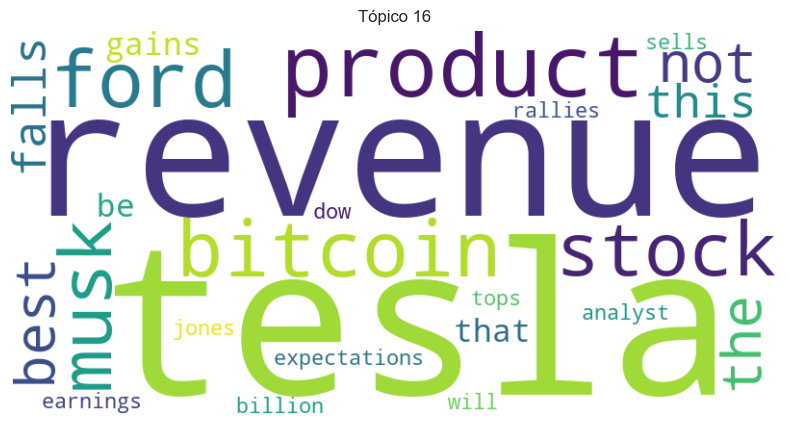

C:\Users\rafae\anaconda3\lib\site-packages\wordcloud\wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



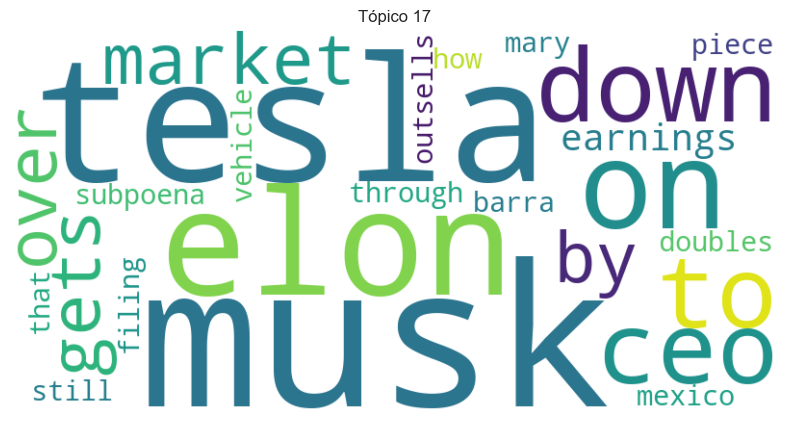

C:\Users\rafae\anaconda3\lib\site-packages\wordcloud\wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



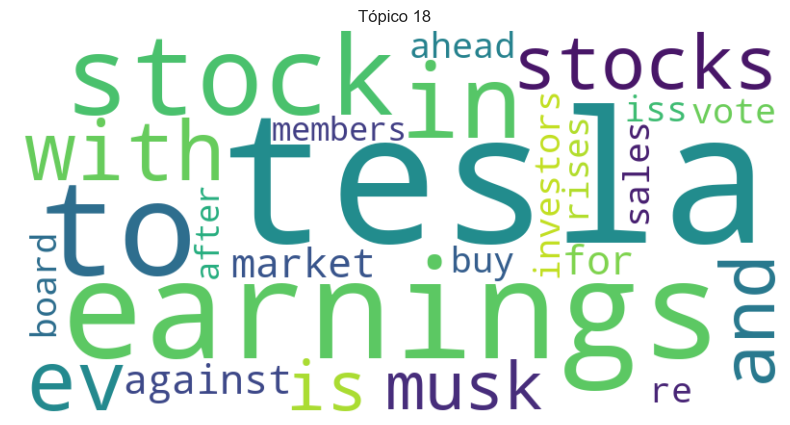

C:\Users\rafae\anaconda3\lib\site-packages\wordcloud\wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



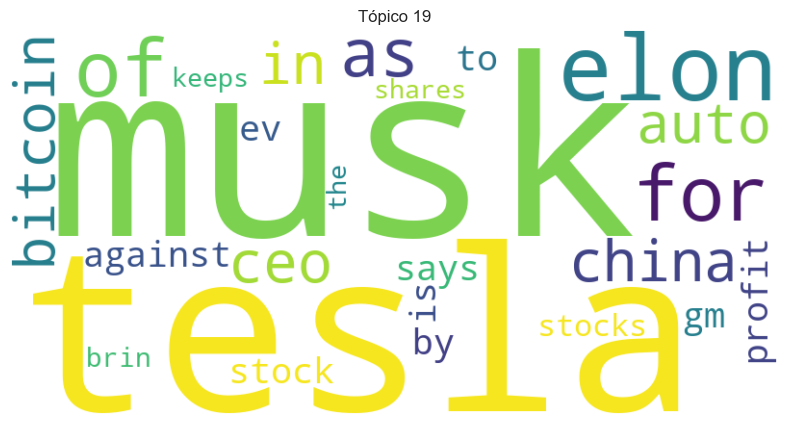

C:\Users\rafae\anaconda3\lib\site-packages\wordcloud\wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



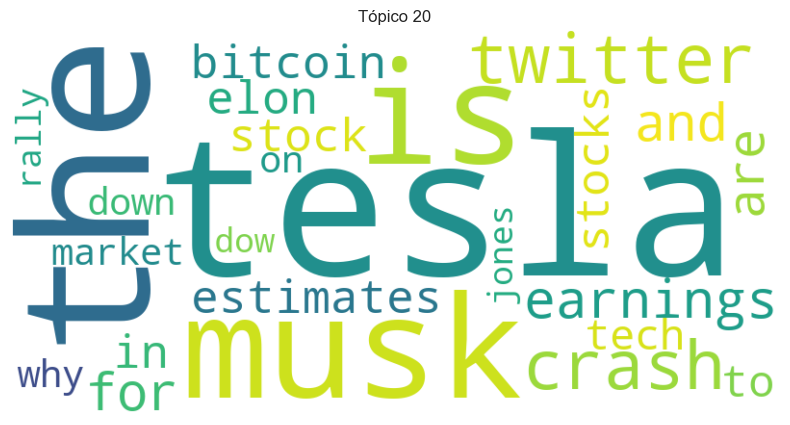

C:\Users\rafae\anaconda3\lib\site-packages\wordcloud\wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



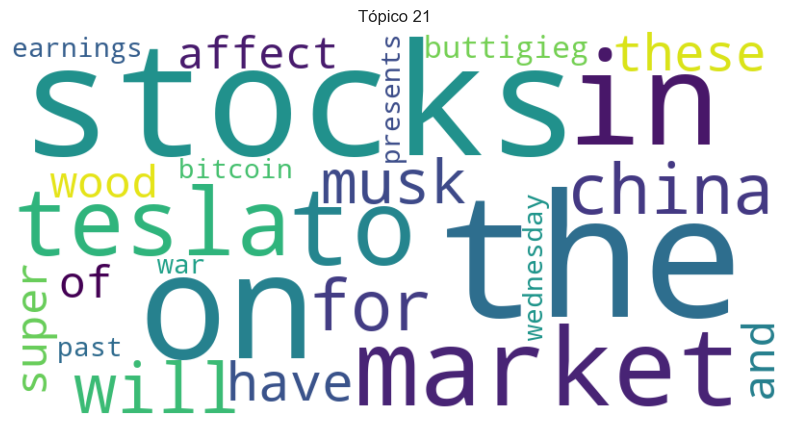

C:\Users\rafae\anaconda3\lib\site-packages\wordcloud\wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



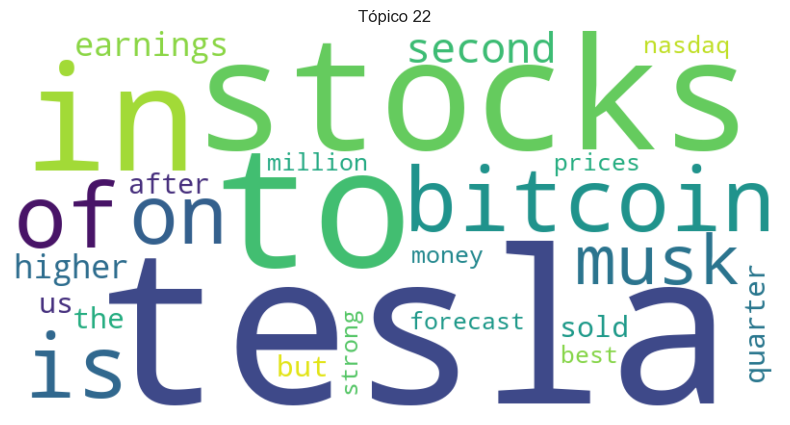

C:\Users\rafae\anaconda3\lib\site-packages\wordcloud\wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



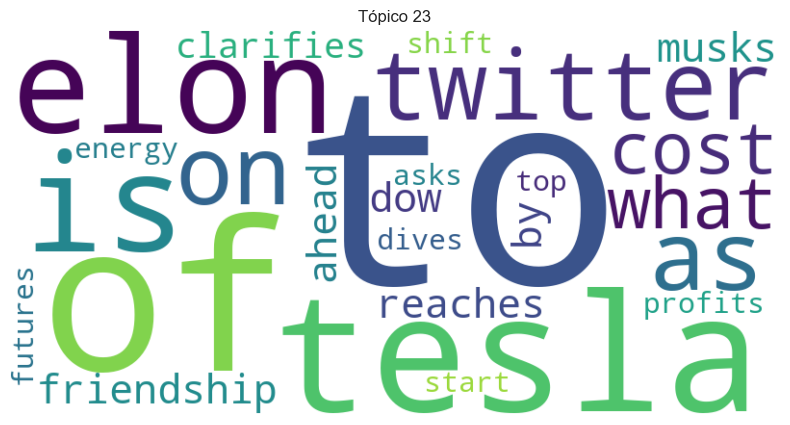

C:\Users\rafae\anaconda3\lib\site-packages\wordcloud\wordcloud.py:106: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



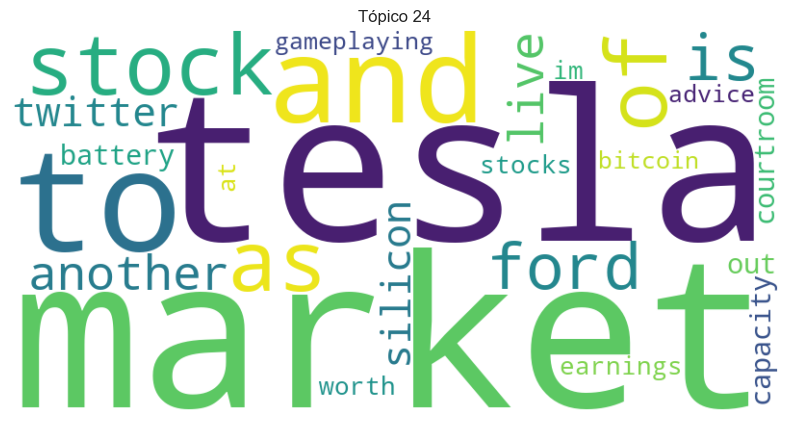

In [177]:
# Gerar os gráficos de nuvem de palavras para cada tópico
for topic_id in range(num_topics):
    words = lda_model.show_topic(topic_id, topn=25)  # Exibir as 10 principais palavras do tópico
    topic_words = {word: prob for word, prob in words}

    wordcloud = WordCloud(width=800, 
                          height=400, 
                          background_color='white').generate_from_frequencies(topic_words)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Tópico {topic_id}')
    plt.show()